In [1070]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
from PIL import Image
import os 
import urllib.request
import numpy as np

def plot_coco(path, index, plot=False):
    '''
    :param path, str: path to txt file containing urls of images to plot for openimages
    '''
    images = []
    with open(path) as f:
        urls = f.readlines()
    for i in urls:
        images.append(Image.open(urllib.request.urlopen(i)))
    print("NUM IMGS: ", len(images))
    #images = [images[index]]
    

    if plot == True:
        plt.figure(figsize=(20,10))
        columns = 4
        for i, image in enumerate(images):
            plt.subplot(len(images) / columns + 1, columns, i + 1)
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
    images = [np.array(i) for i in images]
    return images

def plot_openimages(path):
    '''
    :param path, str: path to txt file containing ids of images to plot for openimages
    '''
    images = []
    with open(path) as f:
        ids = f.readlines()
    for i in ids:
        images.append(Image.open("/u/lab/jr4fs/VisionResearch/finetuneClip/openimages_dataset/val/"+i.strip()+'.jpg'))
    plt.figure(figsize=(20,10))
    columns = 10
    print("NUM IMAGES: ", len(images))
    for i, image in enumerate(images[:50]):
        plt.subplot(len(images[:50]) / columns + 1, columns, i + 1)
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])

NUM IMAGES:  16


/u/lab/jr4fs/anaconda2/envs/coco_exp/lib/python3.6/site-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  if sys.path[0] == '':


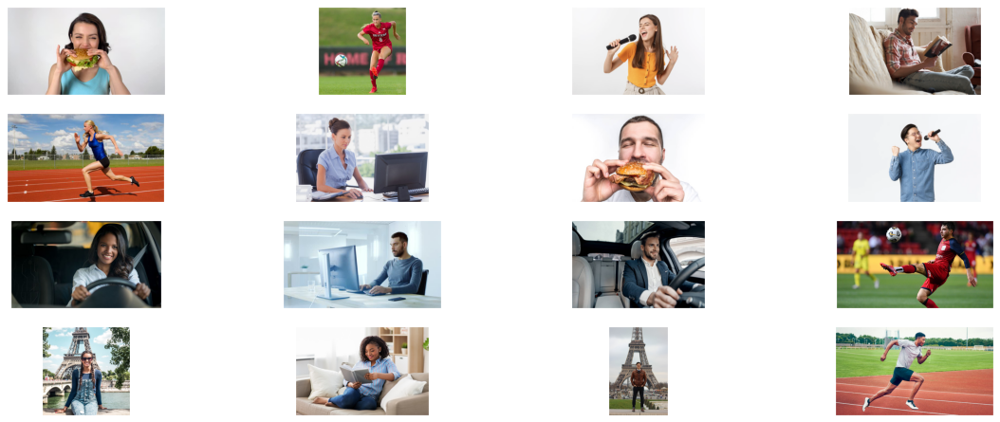

In [940]:
img_pairs = os.listdir('pairs/')
images = []
for i in img_pairs:
    if i != '.DS_Store' and i != '.ipynb_checkpoints':
        images.append(Image.open("pairs/"+i.strip()))
        
        
plt.figure(figsize=(20,10))
columns = 4
print("NUM IMAGES: ", len(images))
for i, image in enumerate(images):
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

NUM IMGS:  12


/u/lab/jr4fs/anaconda2/envs/coco_exp/lib/python3.6/site-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.


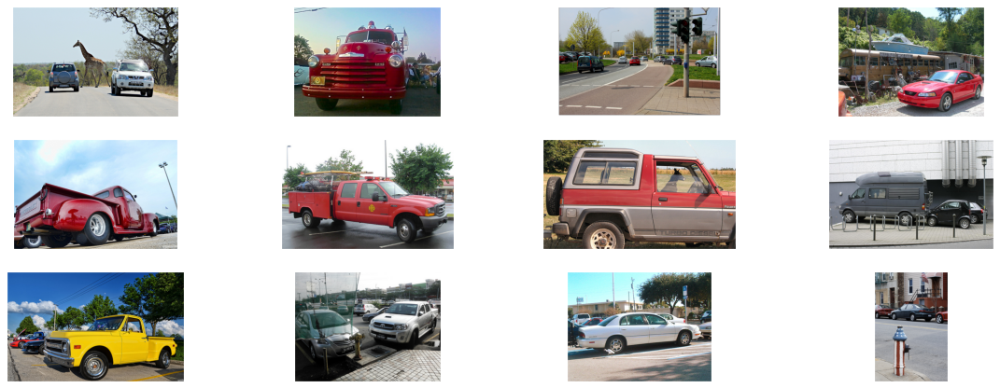

In [1130]:
# All the files containing ids for each class are located in openimages_test or coco_test, this example is plotting car images
path_to_class = '/u/lab/jr4fs/bias-analysis-in-CNNs/analysis_sets/coco_test/car.txt'
all_car_man = plot_coco(path_to_class, 3, plot=True)


NUM IMGS:  9


/u/lab/jr4fs/anaconda2/envs/coco_exp/lib/python3.6/site-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.


NUM IMGS:  6


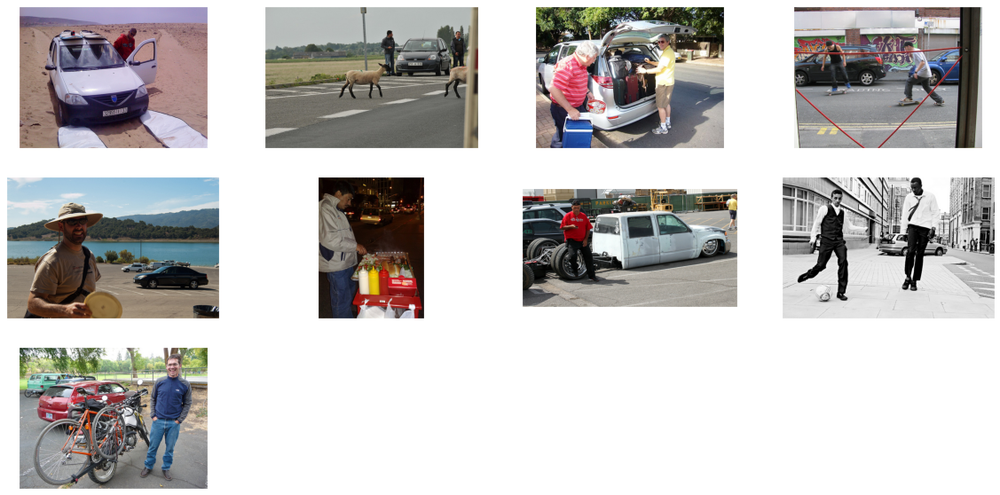

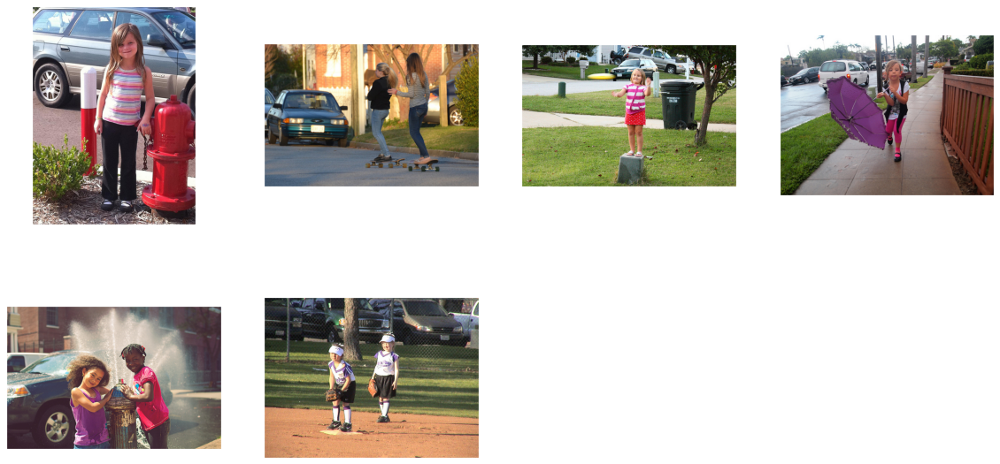

In [613]:
# All the files containing ids for each class are located in openimages_test or coco_test, this example is plotting car images
path_to_class = '/u/lab/jr4fs/bias-analysis-in-CNNs/analysis_sets/coco_test/car_man.txt'
car_man_one = plot_coco(path_to_class, 3, plot=True)
path_to_class = '/u/lab/jr4fs/bias-analysis-in-CNNs/analysis_sets/coco_test/car_woman.txt'
car_woman_one = plot_coco(path_to_class, 1, plot=True)

NUM IMGS:  23


/u/lab/jr4fs/anaconda2/envs/coco_exp/lib/python3.6/site-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.


NUM IMGS:  23
NUM IMGS:  23
NUM IMGS:  23
NUM IMGS:  23
NUM IMGS:  16
NUM IMGS:  16
NUM IMGS:  16
NUM IMGS:  16
NUM IMGS:  16


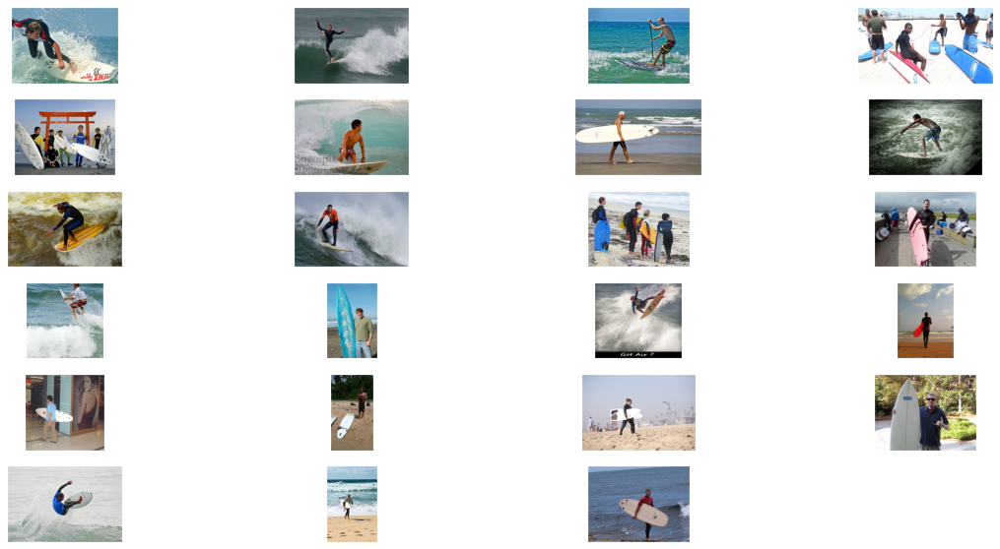

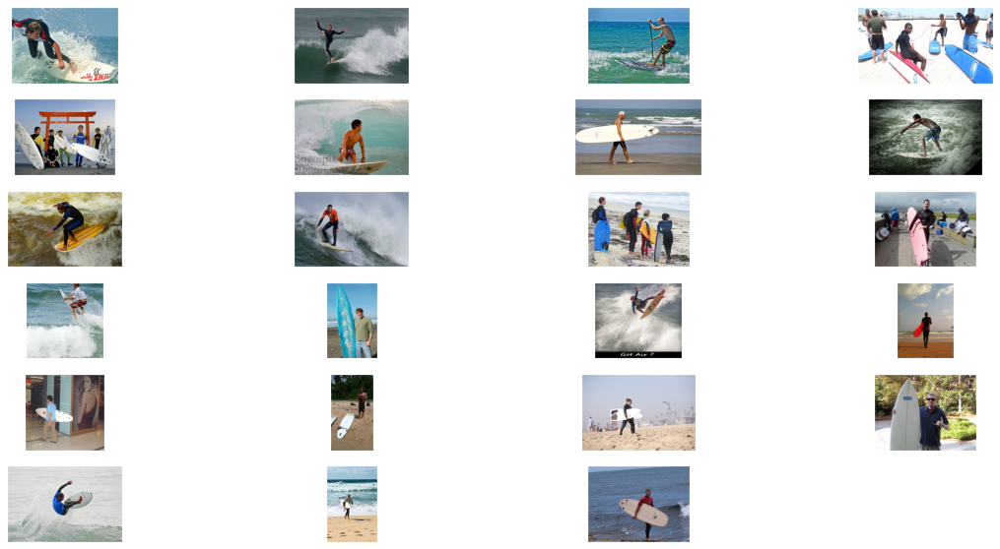

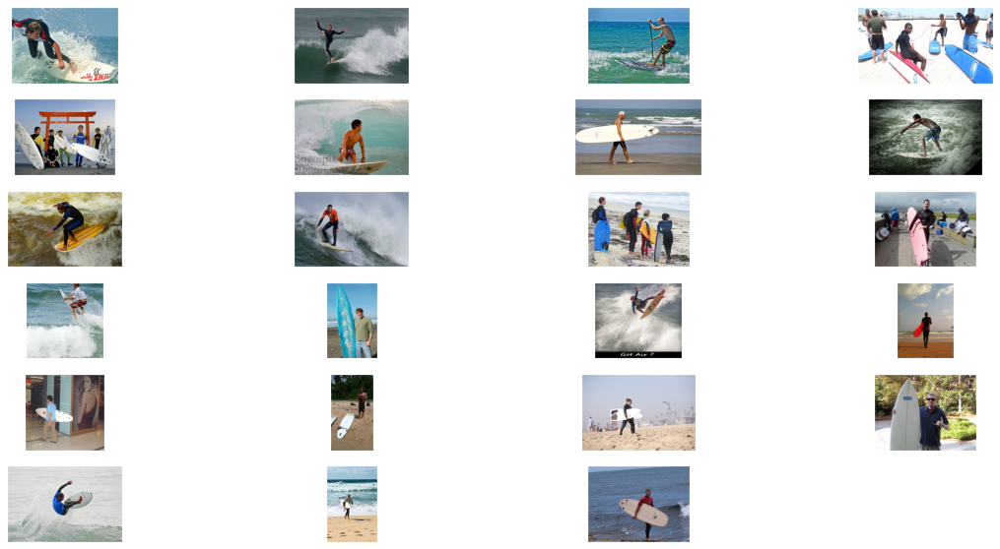

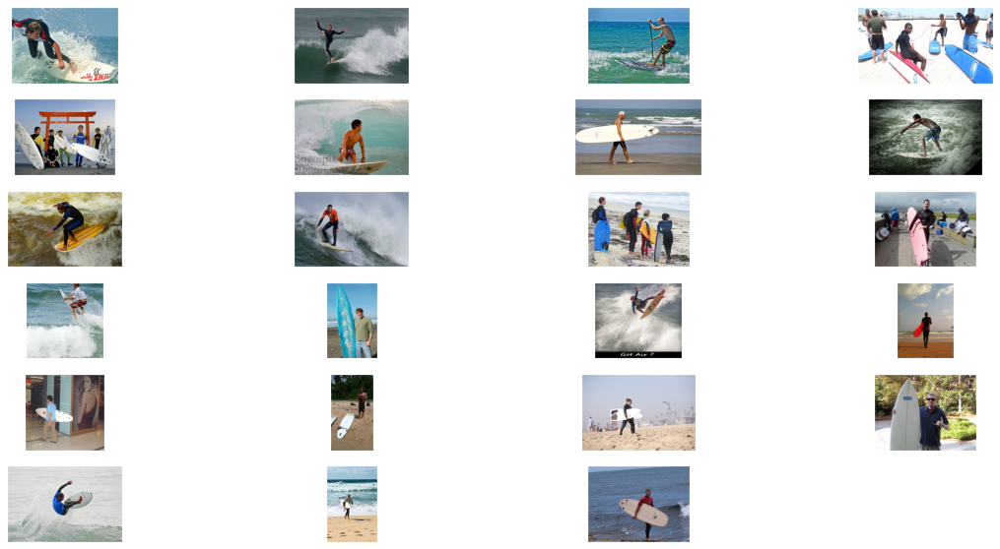

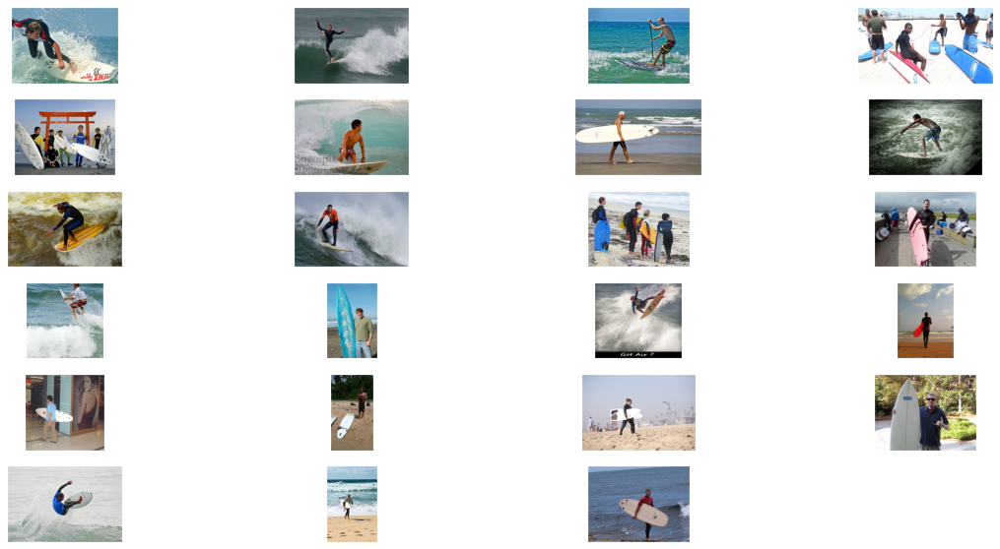

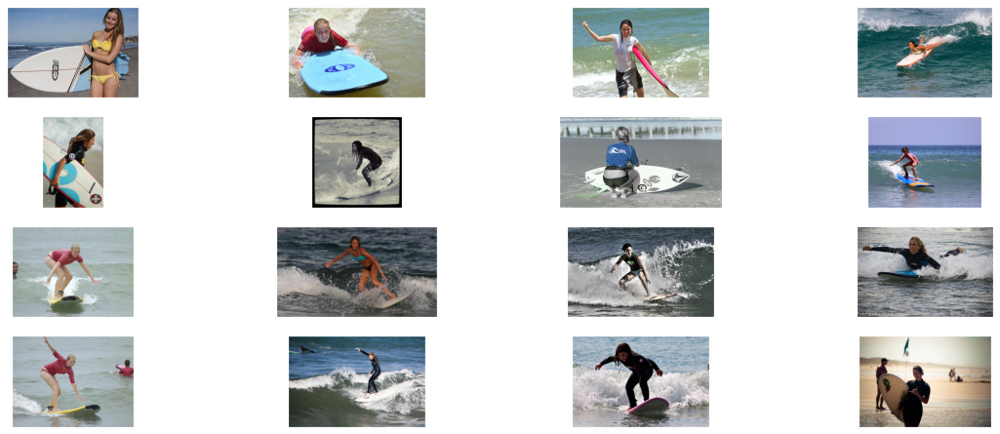

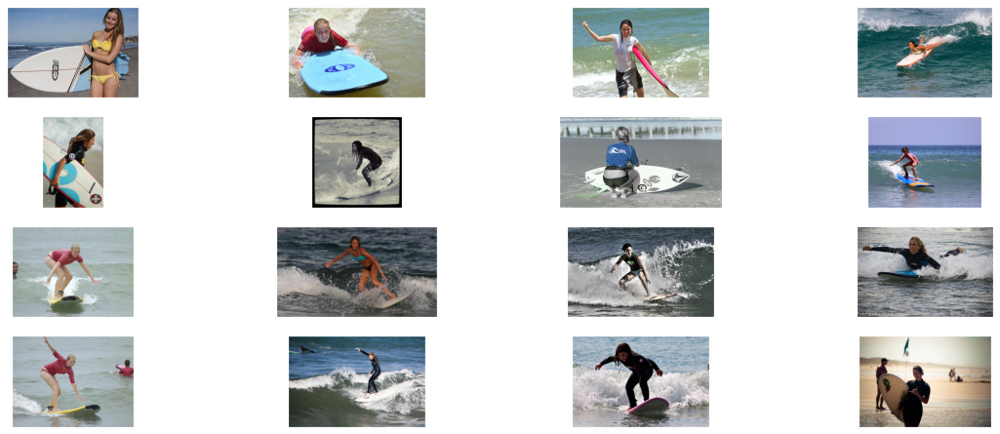

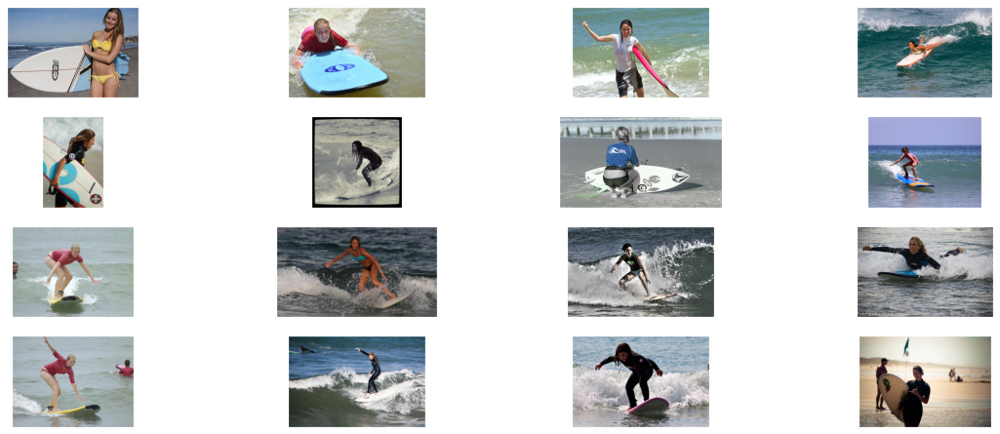

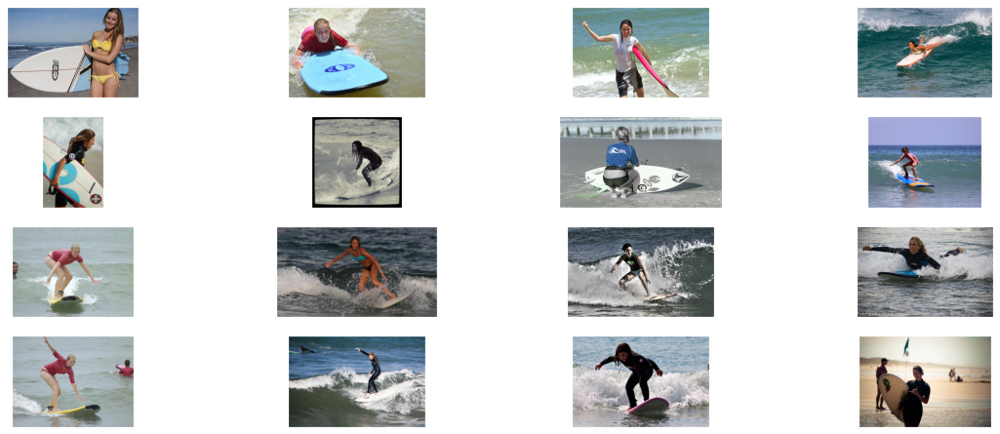

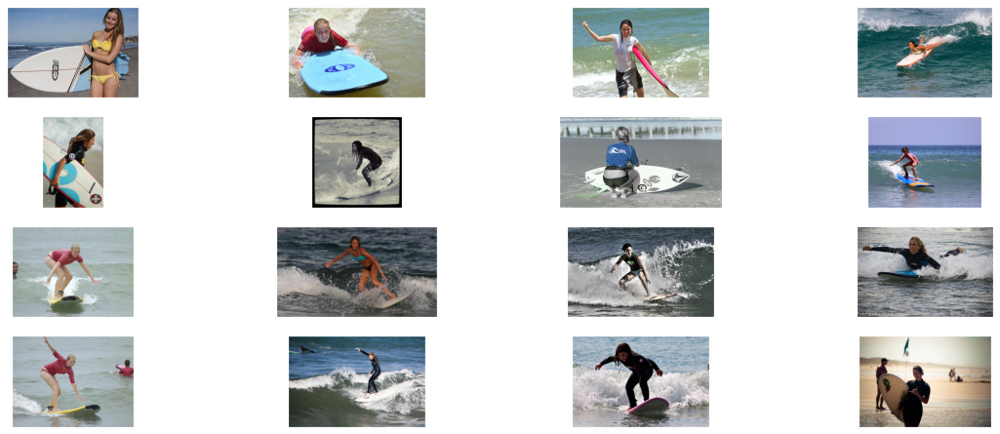

In [614]:
path_to_class = '/u/lab/jr4fs/bias-analysis-in-CNNs/analysis_sets/coco_test/surfboard_man.txt'
surfb_man_one = plot_coco(path_to_class, 13, plot=True)
surfb_man_two = plot_coco(path_to_class, 9, plot=True)
surfb_man_three = plot_coco(path_to_class, 5, plot=True)
surfb_man_four = plot_coco(path_to_class, 13, plot=True)
surfb_man_five = plot_coco(path_to_class, 22, plot=True)

path_to_class = '/u/lab/jr4fs/bias-analysis-in-CNNs/analysis_sets/coco_test/surfboard_woman.txt'
surfb_woman_one = plot_coco(path_to_class, 0, plot=True)
surfb_woman_two = plot_coco(path_to_class, 7, plot=True)
surfb_woman_three = plot_coco(path_to_class, 8, plot=True)
surfb_woman_four = plot_coco(path_to_class, 0, plot=True)
surfb_woman_five = plot_coco(path_to_class, 2, plot=True)

NUM IMGS:  8


/u/lab/jr4fs/anaconda2/envs/coco_exp/lib/python3.6/site-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.


NUM IMGS:  8
NUM IMGS:  9
NUM IMGS:  9


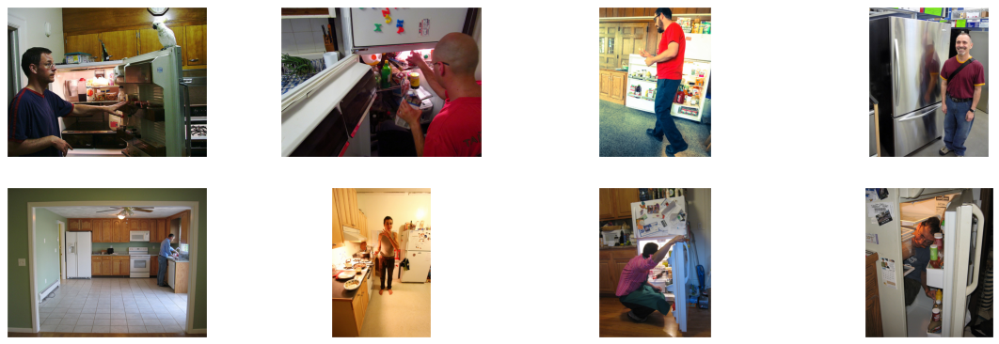

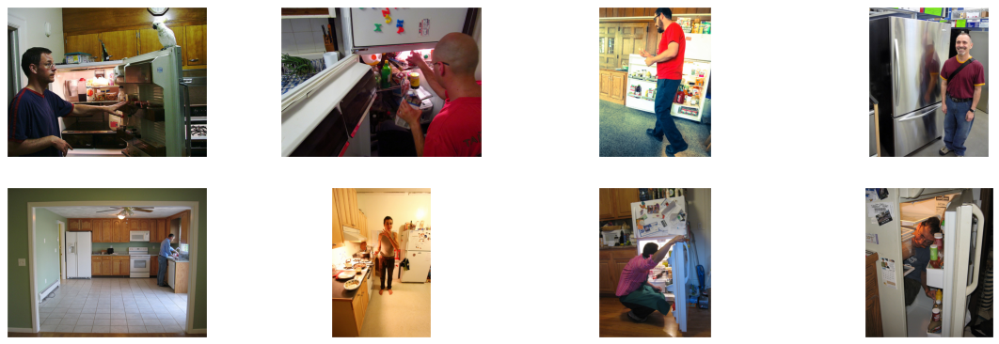

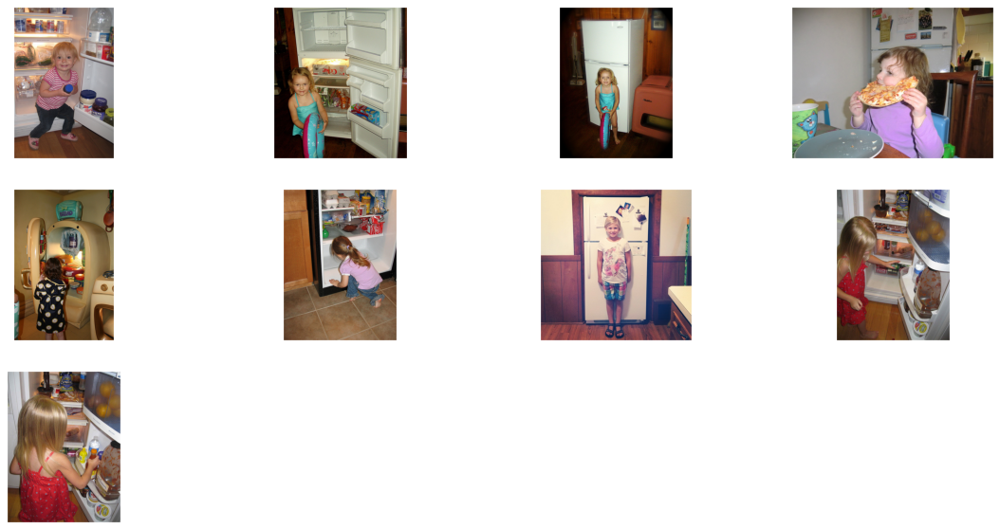

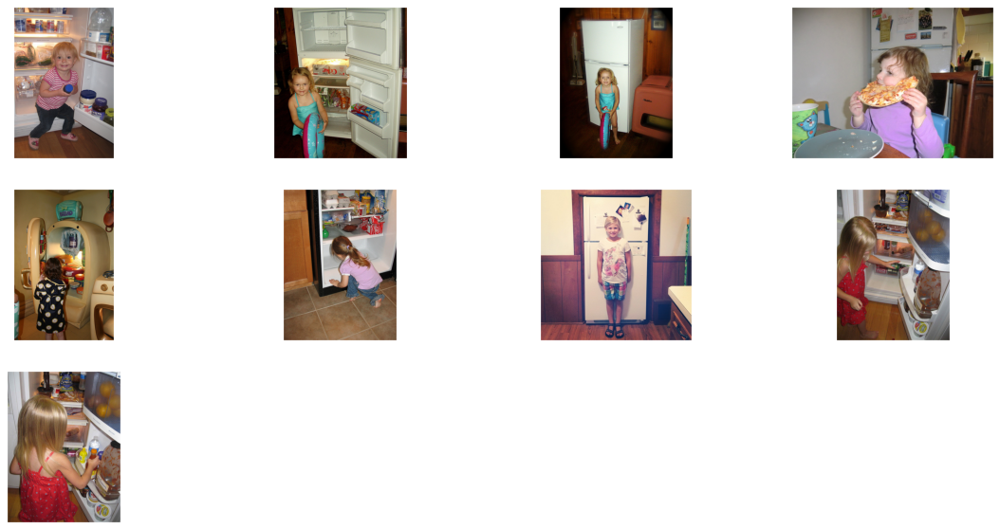

In [615]:
path_to_class = '/u/lab/jr4fs/bias-analysis-in-CNNs/analysis_sets/coco_test/refrigerator_man.txt'
refrig_man_one = plot_coco(path_to_class, 3, plot=True)
refrig_man_two = plot_coco(path_to_class, 3, plot=True)
path_to_class = '/u/lab/jr4fs/bias-analysis-in-CNNs/analysis_sets/coco_test/refrigerator_woman.txt'
refrig_woman_one = plot_coco(path_to_class, 2, plot=True)
refrig_woman_two = plot_coco(path_to_class, 6, plot=True)

# Extracting Saved Features

In [616]:
def load_features(folder, pca, only_pretrained=False):
    if pca==0.0:
        pca_path = 'no_pca/'
    else:
        pca_path = 'pca/'
    if only_pretrained == True:
        features = dict()
        features_pt = os.listdir(folder+'/pretrained_features/'+pca_path)
        for file_name in features_pt:
            features[os.path.splitext(file_name)[0]] = np.load(folder + '/pretrained_features/'+pca_path + file_name, allow_pickle=True)
    else:
        features = dict()
        features_pt = os.listdir(folder+'/pretrained_features/'+pca_path)
        features_ft = os.listdir(folder+'/finetuned_features/'+pca_path)
        for file_name in features_pt:
            features[os.path.splitext(file_name)[0]] = np.load(folder + '/pretrained_features/' + pca_path + file_name, allow_pickle=True)
        for file_name in features_ft:
            features[os.path.splitext(file_name)[0]] = np.load(folder + '/finetuned_features/' + pca_path + file_name, allow_pickle=True)
    return features


In [617]:
dataset = 'coco'
model_name = 'resnet50'
datestring = '2022-01-19 16:43:15'
model_path = '../experiments/'+ dataset + '/' + model_name+'/'+datestring
features = load_features(model_path, pca=0.0, only_pretrained=False)



# Extracting Features Manually

In [1072]:
import yaml
from torchvision import datasets, models, transforms
import torch.nn as nn


from __future__ import print_function
from __future__ import division
import subprocess
import numpy as np
import json, os, sys, random, pickle
import torchvision.datasets as dset
from torchvision import transforms 
import os
import skimage
#import IPython.display
#import matplotlib.pyplot as plt
from PIL import Image
import urllib
from collections import OrderedDict
import torchvision.datasets as dset
from torchvision import transforms 
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
import skimage
import IPython.display
import urllib
from collections import OrderedDict
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import datasets, models, transforms
import time
import copy
import tqdm
from sklearn.metrics import average_precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import fbeta_score

from sklearn import metrics
from sklearn.metrics import accuracy_score
import clip
#from skimage import io
from pycocotools.coco import COCO
from sklearn.preprocessing import StandardScaler

import torch
print("Torch version:", torch.__version__)
torch.multiprocessing.set_sharing_strategy('file_system')
import argparse


import torchmetrics 
from sklearn.decomposition import PCA
import pytorch_lightning as pl



class LitPytorchModels(pl.LightningModule):
    def __init__(self, dataset, model_name, num_classes, feature_extract, lr, momentum, optimizer, finetune, lr_scheduler, model_path):
        super().__init__()
        model_ft, criterion, optimizer = initialize_model_pytorch(model_name, num_classes, feature_extract, lr, momentum, optimizer, use_pretrained=finetune)
        self.model = model_ft
        self.criterion = criterion
        self.optimizer = optimizer
        self.model_name =  model_name
        self.num_classes = num_classes
        self.dataset = dataset

        if lr_scheduler == 'cosine':
            self.scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(self.optimizer, T_max = 100)
            self.lr_scheduler_config = {
                "scheduler": self.scheduler,
                "interval": "epoch",
                "frequency": 1,
            }
        elif lr_scheduler == 'reduce':
            self.scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(self.optimizer)
            self.lr_scheduler_config = {
                "scheduler": self.scheduler,
                "interval": "epoch",
                "frequency": 1,
                "monitor": "Training Loss",
            }
        else:
            self.scheduler = None
        

        self.model_path = model_path

    def forward(self, x):
        outputs = self.model(x.float())
        return outputs

    def configure_optimizers(self):
        if self.scheduler == None:
            return self.optimizer
        else:
            #return [self.optimizer], [self.scheduler]
            return {"optimizer": self.optimizer, "lr_scheduler": self.lr_scheduler_config}
    
    def training_step(self, batch, batch_idx):
        inputs, labels = batch
        outputs = self.model(inputs.float())
        loss = self.criterion(outputs, labels)

        preds = torch.sigmoid(outputs)
        if batch_idx % 1000 == 0:
            print("Saving preds ... ")
            torch.save(inputs, self.model_path+"/model/updates/train_inputs_"+str(batch_idx)+".pt")
            torch.save(labels, self.model_path+"/model/updates/train_labels_"+str(batch_idx)+".pt")
            torch.save(preds, self.model_path+"/model/updates/train_preds_"+str(batch_idx)+".pt")
        
        logs = {"train_loss": loss}
        batch_dictionary = {
            'loss': loss,
            'log': logs,
            'preds': preds.data.cpu(),
            'labels': labels.data.cpu()
        }
        self.log('Training Loss', loss, on_step=True, on_epoch=False)
        return batch_dictionary

    def training_epoch_end(self,outputs):
        avg_loss = torch.stack([x['loss'] for x in outputs]).mean()

        total_preds = torch.cat([x['preds'] for x in outputs], 0) 
        total_targets = torch.cat([x['labels'] for x in outputs], 0) 
        task_f1_score = f1_score(total_targets.numpy(), (total_preds >= 0.5).long().numpy(), average = 'macro')
        task_f1_score_micro = f1_score(total_targets.numpy(), (total_preds >= 0.5).long().numpy(), average = 'micro')
        fbeta = fbeta_score(total_targets.numpy(), (total_preds >= 0.3).long().numpy(), 1.0, average='samples')
        meanAP = average_precision_score(total_targets.numpy(), total_preds.numpy(), average='macro')
        # creating log dictionary
        tensorboard_logs = {'loss': avg_loss,
                            'Train Macro F1': torch.tensor(task_f1_score),
                            'Train Micro F1': torch.tensor(task_f1_score_micro), 
                            'Train Fbeta': torch.tensor(fbeta),
                            'Train MeanAP': torch.tensor(meanAP)}
        epoch_dictionary={
            # required
            'loss': avg_loss,
            # for logging purposes
            'log': tensorboard_logs}
        print('F1: {:.4f} mAP: {:.4f} fbeta: {:.4f}  Micro f1: {:.4f} Loss: {:.4f}'.format(task_f1_score, meanAP, fbeta, task_f1_score_micro, avg_loss))
        
        self.log('Avg Training Loss', avg_loss, on_step=False, on_epoch=True)
        self.log('Train Macro F1 Score', torch.tensor(task_f1_score), on_step=False, on_epoch=True)
        self.log('Train Micro F1 Score', torch.tensor(task_f1_score_micro), on_step=False, on_epoch=True)
        self.log('Train FBeta Score', torch.tensor(fbeta), on_step=False, on_epoch=True)
        self.log('Train Mean AP', torch.tensor(meanAP), on_step=False, on_epoch=True)
        #return epoch_dictionary

    def validation_step(self, batch, batch_idx):
        inputs, labels = batch
        outputs = self.model(inputs.float())
        loss = self.criterion(outputs, labels)

        preds = torch.sigmoid(outputs)
        if batch_idx % 1000 == 0:
            print("Saving preds ... ")
            torch.save(inputs, self.model_path+"/model/updates/val_inputs_"+str(batch_idx)+".pt")
            torch.save(labels, self.model_path+"/model/updates/val_labels_"+str(batch_idx)+".pt")
            torch.save(preds, self.model_path+"/model/updates/val_preds_"+str(batch_idx)+".pt")
        
        logs = {"val_loss": loss}
        batch_dictionary = {
            'loss': loss,
            'log': logs,
            'preds': preds.data.cpu(),
            'labels': labels.data.cpu()
        }
        self.log('Validation Loss', loss, on_step=True, on_epoch=False)
        return batch_dictionary

    def validation_epoch_end(self, outputs):
        avg_loss = torch.stack([x['loss'] for x in outputs]).mean()

        total_preds = torch.cat([x['preds'] for x in outputs], 0) 
        total_targets = torch.cat([x['labels'] for x in outputs], 0) 
        task_f1_score = f1_score(total_targets.numpy(), (total_preds >= 0.5).long().numpy(), average = 'macro')
        task_f1_score_micro = f1_score(total_targets.numpy(), (total_preds >= 0.5).long().numpy(), average = 'micro')
        fbeta = fbeta_score(total_targets.numpy(), (total_preds >= 0.3).long().numpy(), 1.0, average='samples')
        meanAP = average_precision_score(total_targets.numpy(), total_preds.numpy(), average='macro')
        # creating log dictionary
        tensorboard_logs = {'Val loss': avg_loss,
                            'Val Macro F1': torch.tensor(task_f1_score),
                            'Val Micro F1': torch.tensor(task_f1_score_micro), 
                            'Val Fbeta': torch.tensor(fbeta),
                            'Val MeanAP': torch.tensor(meanAP)}
        epoch_dictionary={
            # required
            'loss': avg_loss,
            # for logging purposes
            'log': tensorboard_logs}
        print('F1: {:.4f} mAP: {:.4f} fbeta: {:.4f}  Micro f1: {:.4f} Loss: {:.4f}'.format(task_f1_score, meanAP, fbeta, task_f1_score_micro, avg_loss))

        self.log('Avg Validation Loss', avg_loss, on_step=False, on_epoch=True)
        
        self.log('Val Macro F1 Score', torch.tensor(task_f1_score), on_step=False, on_epoch=True)
        self.log('Val Micro F1 Score', torch.tensor(task_f1_score_micro), on_step=False, on_epoch=True)
        self.log('Val FBeta Score', torch.tensor(fbeta), on_step=False, on_epoch=True)
        self.log('Val Mean AP', torch.tensor(meanAP), on_step=False, on_epoch=True)

        #return epoch_dictionary
        
        
        
class PytorchFeatureExtractor():
    def __init__(self, dataset, model_name, num_classes):
        self.dataset = dataset
        if self.dataset == 'openimages':
            self.openimages_path = "../VisionResearch/finetuneClip/openimages_dataset/val/"
        self.model_name = model_name
        self.num_classes = num_classes
        

    def process_imgs(self, directory):
        preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),])
        images_stacked = []

        for filename in directory:
            if self.dataset=='coco':
                input_image = Image.open(urllib.request.urlopen(filename)).convert("RGB")
            elif self.dataset == 'openimages':
                input_image = Image.open(self.openimages_path+filename.strip()+'.jpg').convert("RGB")
            else:
                print("Dataset not implemented")
            input_tensor = preprocess(input_image)
            images_stacked.append(input_tensor)
        return torch.tensor(torch.stack(images_stacked,0))

    def extract_features_resnet(self, model, directory, norm="norm_one"):
        features_dir = [] # batch x 16 x 2048
        images_processed = self.process_imgs(directory)
        #print("processed: ", images_processed.shape)
        imgs_split = torch.split(images_processed, 16)
        for input_batch in imgs_split:
            # input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model
            if torch.cuda.is_available():
                input_batch = input_batch.to('cuda')
                model.to('cuda')
            with torch.no_grad():
                output = model(input_batch)
                output = torch.squeeze(output)
                #output = torch.squeeze(output)
                if input_batch.shape[0] == 1:
                    output = torch.unsqueeze(output, 0)
                features_dir.append(output)
        features = torch.tensor(torch.cat(features_dir, 0))
        if norm == "norm_one":
            features /= features.norm(dim=-1, keepdim=True)
        else:
            scaler = StandardScaler() 
            features = scaler.fit_transform(features.cpu())
        return torch.tensor(features)


    def build_features_pt(self, images):
        model_loaded = load_models_pytorch(self.model_name, self.num_classes, True)
        if self.model_name != 'bit_resnet50':
            modules=list(model_loaded.children())[:-1]
            resnet_model=nn.Sequential(*modules)
            for p in resnet_model.parameters():
                p.requires_grad = False
            features = self.extract_features_resnet(resnet_model, images)
        else:
            if self.model_name == 'bit_resnet50':
                model_loaded.head = model_loaded.head[:-1]
                features = self.extract_features_resnet(model_loaded, images)
        return features
    
    
    def build_features_ft(self, model_ft, images):
        if self.model_name != 'bit_resnet50':
            modules=list(model_ft.children())[:-1]
            resnet_model=nn.Sequential(*modules)
            for p in resnet_model.parameters():
                p.requires_grad = False
            features = self.extract_features_resnet(resnet_model, images)
        else:
            if self.model_name == 'bit_resnet50':
                temp_model = copy.deepcopy(model_ft)
                temp_model.head = temp_model.head[:-1]
                features = self.extract_features_resnet(temp_model, images)
        return features
     
    def extract_features(self, model_ft=None, dataset_name=None, only_pretrained=False, finetune=True, config=None, pca=None, paired_features=None):
        #surfboard, car, refrigerator, random_loaded, man_background, woman_background, stop_sign = analysis_data(dataset_name, config)
        analysis_data_loaded, analysis_data_names = analysis_data(config) # returns a dictionary mapping category[subcategory] = list_imgs
        #print("ANALYSIS DATA")
        #print(analysis_data_loaded)
        #print("ANALYSIS DATA NAMES")
        #print(analysis_data_names)
        if only_pretrained == True:
            print("Building pretrained features for ... " + self.model_name)
            pretrained_features = dict()
            for category in analysis_data_loaded:
                for subcategory in analysis_data_loaded[category]:
                    print("Building pretrained features for: ", analysis_data_names[category][subcategory])
                    features = self.build_features_pt(analysis_data_loaded[category][subcategory])
                    pretrained_features[analysis_data_names[category][subcategory] + "_pt"] = features
            return pretrained_features
        else:
            print("Building finetuned and pretrained features for ... " + self.model_name)
            all_features = dict()
            all_features_ft = dict()
            all_features_pt = dict()
            
            for category in analysis_data_loaded:
                for subcategory in analysis_data_loaded[category]:
                    print("Building features for: ", analysis_data_names[category][subcategory])
                    features_ft = self.build_features_ft(model_ft, analysis_data_loaded[category][subcategory])
                    #np.save(save_path+"finetuned_features/no_pca/" + analysis_data_names[category][subcategory] + "_ft.npy", features_ft.cpu().numpy())
                    all_features[analysis_data_names[category][subcategory] + "_ft"] = features_ft
                    all_features_ft[analysis_data_names[category][subcategory] + "_ft"] = features_ft
                    
                    features_pt = self.build_features_pt(analysis_data_loaded[category][subcategory])
                    #np.save(save_path+"pretrained_features/no_pca/" + analysis_data_names[category][subcategory] + "_pt.npy", features_pt.cpu().numpy())
                    all_features[analysis_data_names[category][subcategory] + "_pt"] = features_pt
                    all_features_pt[analysis_data_names[category][subcategory] + "_pt"] = features_pt
            
            return all_features
        

def initialize_model_pytorch(model_name, num_classes, feature_extract, lr, momentum, optimizer_name, use_pretrained):
    model_ft = load_models_pytorch(model_name, num_classes, use_pretrained)
    set_parameter_requires_grad(model_ft, feature_extract)
    if model_name == 'alexnet' or model_name == 'vgg':
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
    elif model_name != 'bit_resnet50' and model_name != 'moco_resnet50'and model_name != 'simclr_resnet50':
        num_ftrs = model_ft.fc.in_features
        #model_ft.fc = nn.Linear(num_ftrs, num_classes)
        model_ft.fc = nn.Linear(num_ftrs, num_classes)
        # nn.Conv2d(num_ftrs, 601, kernel_size=(1,1))
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print(model_ft)
    model_ft = model_ft.to(device)
    params_to_update = model_ft.parameters()

    if feature_extract:
        params_to_update = []
        for name,param in model_ft.named_parameters():
            if param.requires_grad == True:
                params_to_update.append(param)
                print("\t",name)
    else:
        for name,param in model_ft.named_parameters():
            if param.requires_grad == True:
                print("\t",name)


    # Observe that all parameters are being optimized
    if optimizer_name == 'sgd':
        optimizer = optim.SGD(params_to_update, lr=lr, momentum=momentum, weight_decay=0.0001)
    elif optimizer_name=='adamax':
        optimizer = optim.Adamax(params_to_update, lr=lr, weight_decay=0.0005)
    elif optimizer_name == 'lars':
        optimizer = get_lars_optimizer((model_ft,))
    else:
        optimizer = torch.optim.Adam(params_to_update, lr=lr, betas=(0.9,0.98),eps=1e-6,weight_decay=1e-6) #Params from paper
    # Setup the loss fxn
    criterion = nn.BCEWithLogitsLoss()

    return model_ft, criterion, optimizer

def load_models_pytorch(model_name, num_classes, use_pretrained):
    model_ft = None
    model_init = dict()
    model_init['resnet18'] = models.resnet18
    model_init['resnet34'] = models.resnet34
    model_init['resnet50'] = models.resnet50
    model_init['resnet101'] = models.resnet101
    model_init['resnet152'] = models.resnet152
    model_init['resnext50_32x4d'] = models.resnext50_32x4d
    model_init['resnext101_32x8d'] = models.resnext101_32x8d
    model_init['wide_resnet50_2'] = models.wide_resnet50_2
    model_init['wide_resnet101_2'] = models.wide_resnet101_2
    model_init['alexnet'] = models.alexnet
    model_init['vgg'] = models.vgg11_bn
    model_init['densenet'] = models.densenet121
    model_init['googlenet'] = models.googlenet
    
    if model_name in model_init:
        #if use_pretrained == True:
        model_ft = model_init[model_name](pretrained=use_pretrained)
    else:
        print("Invalid model name, choose from moco_resnet50, resnet18, resnet34, resnet50, resnet101, resnet152, resnext50_32x4d, resnext101_32x8d, wide_resnet50_2, wide_resnet101_2, alexnet, vgg, densenet, googlenet, bit_resnet50")
    return model_ft

def analysis_data(config):
    with open(config, 'r') as f:
        conf = yaml.safe_load(f)
    all_analysis_data = dict()
    analysis_data_names = dict()
    for category in conf['CLASSES']:
        all_analysis_data[category.lower()] = dict()
        for sub_category in conf['CLASSES'][category]:
            all_analysis_data[category.lower()][sub_category] = readFile(conf['CLASSES'][category][sub_category])
    for category in conf['CLASSES_NAMES']:
        analysis_data_names[category.lower()] = dict()
        for sub_category in conf['CLASSES_NAMES'][category]:
            analysis_data_names[category.lower()][sub_category] = conf['CLASSES_NAMES'][category][sub_category]
    return all_analysis_data, analysis_data_names

def readFile(fileName):
    fileObj = open('../'+fileName, "r") 
    urls = fileObj.read().splitlines()   
    fileObj.close()
    return urls



def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False
    init_weights(model)

def init_weights(m):
    '''Initialize weights with zeros
    '''
    if type(m) == nn.Linear:
        m.weight.data.normal_(mean=0.0, std=0.01)
        m.bias.data.zero_()


Torch version: 1.7.1+cu101


In [1073]:
dataset = 'coco'
model_name = 'resnet50'
num_classes = 80
feature_extract = False
lr = 0.01
momentum = 0.9
optimizer = 'sgd'
finetune = True
lr_scheduler = 'none'

datestring = '2022-01-19 16:43:15'
model_path = '../experiments/'+ dataset + '/' + model_name+'/'+datestring
#features = load_features(model_path, pca=0.0, only_pretrained=False)


model_setup = LitPytorchModels(dataset, model_name, num_classes, feature_extract, lr, momentum, optimizer, finetune, lr_scheduler, model_path)
base = model_path + '/model/'+model_name +'/' +'version_0/checkpoints/'
ckpt = os.listdir(base)[0]
PATH = base+ckpt
checkpoint = torch.load(PATH)
checkpoint['state_dict'] = dict(checkpoint['state_dict'])
state_dict_mod = dict()
for i in checkpoint['state_dict']:
    state_dict_mod[i[6:]] = checkpoint['state_dict'][i] 
model_setup.model.load_state_dict(state_dict_mod)
model_ft = model_setup.model.eval()

feature_extractor = PytorchFeatureExtractor(dataset, model_name, 80)
features = feature_extractor.extract_features(model_ft=model_ft, dataset_name=dataset, only_pretrained=False, finetune=True, config='../config/coco.yaml', pca=0.0)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

Building finetuned and pretrained features for ... resnet50
Building features for:  sm


/u/lab/jr4fs/anaconda2/envs/coco_exp/lib/python3.6/site-packages/ipykernel_launcher.py:233: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/u/lab/jr4fs/anaconda2/envs/coco_exp/lib/python3.6/site-packages/ipykernel_launcher.py:252: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/u/lab/jr4fs/anaconda2/envs/coco_exp/lib/python3.6/site-packages/ipykernel_launcher.py:258: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


Building features for:  sw
Building features for:  sa
Building features for:  rm
Building features for:  rw
Building features for:  ra
Building features for:  cm
Building features for:  cw
Building features for:  ca
Building features for:  man
Building features for:  woman
Building features for:  random
Building features for:  stop


In [943]:
def process_imgs(directory):
    preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),])
    images_stacked = []

    for filename in directory:
        #input_image = Image.open(urllib.request.urlopen(filename)).convert("RGB")
        input_tensor = preprocess(filename)
        images_stacked.append(input_tensor)
    return torch.tensor(torch.stack(images_stacked,0))

def extract_features_resnet(model, directory, norm="norm_one"):
    features_dir = [] # batch x 16 x 2048
    images_processed = process_imgs(directory)
    #print("processed: ", images_processed.shape)
    imgs_split = torch.split(images_processed, 16)
    for input_batch in imgs_split:
        # input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model
        if torch.cuda.is_available():
            input_batch = input_batch.to('cuda')
            model.to('cuda')
        with torch.no_grad():
            output = model(input_batch)
            output = torch.squeeze(output)
            #output = torch.squeeze(output)
            if input_batch.shape[0] == 1:
                output = torch.unsqueeze(output, 0)
            features_dir.append(output)
    features = torch.tensor(torch.cat(features_dir, 0))
    if norm == "norm_one":
        features /= features.norm(dim=-1, keepdim=True)
    else:
        scaler = StandardScaler() 
        features = scaler.fit_transform(features.cpu())
    return torch.tensor(features)


def build_features_pt(model_name, num_classes, images):
    model_loaded = load_models_pytorch(model_name, num_classes, True)
    if model_name != 'bit_resnet50':
        modules=list(model_loaded.children())[:-1]
        resnet_model=nn.Sequential(*modules)
        for p in resnet_model.parameters():
            p.requires_grad = False
        features = extract_features_resnet(resnet_model, images)
    else:
        if model_name == 'bit_resnet50':
            model_loaded.head = model_loaded.head[:-1]
            features = extract_features_resnet(model_loaded, images)
    return features


def build_features_ft(model_name, model_ft, images):
    if model_name != 'bit_resnet50':
        modules=list(model_ft.children())[:-1]
        resnet_model=nn.Sequential(*modules)
        for p in resnet_model.parameters():
            p.requires_grad = False
        features = extract_features_resnet(resnet_model, images)
    else:
        if model_name == 'bit_resnet50':
            temp_model = copy.deepcopy(model_ft)
            temp_model.head = temp_model.head[:-1]
            features = extract_features_resnet(temp_model, images)
    return features


In [944]:
img_pairs = os.listdir('pairs/')
images_google = []
img_labels = []
for i in img_pairs:
    if i != '.DS_Store' and i != '.ipynb_checkpoints':
        img_labels.append(i)
        images_google.append(Image.open("pairs/"+i.strip()).convert("RGB"))

features_ft_pairs = build_features_ft(model_name, model_ft, images_google)
features_pt_pairs = build_features_pt(model_name, 80, images_google)

/u/lab/jr4fs/anaconda2/envs/coco_exp/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  del sys.path[0]
/u/lab/jr4fs/anaconda2/envs/coco_exp/lib/python3.6/site-packages/ipykernel_launcher.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/u/lab/jr4fs/anaconda2/envs/coco_exp/lib/python3.6/site-packages/ipykernel_launcher.py:38: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


In [949]:
img_ieat_female_dir = os.listdir('ieat/data/experiments/gender/female/')
img_ieat_female = []
img_ieat_female_labels = []
for i in img_ieat_female_dir:
    if i != '.DS_Store' and i != '.ipynb_checkpoints':
        img_ieat_female_labels.append('woman')
        img_ieat_female.append(Image.open('ieat/data/experiments/gender/female/'+i.strip()).convert("RGB"))

features_ft_ieat_female = build_features_ft(model_name, model_ft, img_ieat_female)
features_pt_ieat_female = build_features_pt(model_name, 80, img_ieat_female)

img_ieat_male_dir = os.listdir('ieat/data/experiments/gender/male/')
img_ieat_male = []
img_ieat_male_labels = []
for i in img_ieat_male_dir:
    if i != '.DS_Store' and i != '.ipynb_checkpoints':
        img_ieat_male_labels.append('man')
        img_ieat_male.append(Image.open('ieat/data/experiments/gender/male/'+i.strip()).convert("RGB"))

features_ft_ieat_male = build_features_ft(model_name, model_ft, img_ieat_male)
features_pt_ieat_male = build_features_pt(model_name, 80, img_ieat_male)


all_ieat_labels = img_ieat_female_labels.copy()
all_ieat_labels.extend(img_ieat_male_labels)

/u/lab/jr4fs/anaconda2/envs/coco_exp/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  del sys.path[0]
/u/lab/jr4fs/anaconda2/envs/coco_exp/lib/python3.6/site-packages/ipykernel_launcher.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/u/lab/jr4fs/anaconda2/envs/coco_exp/lib/python3.6/site-packages/ipykernel_launcher.py:38: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


In [1122]:
import torch

def calc_difference_vector_old(cat_one, cat_two, ind_one, ind_two, features):
    vec1 = features[cat_one][ind_one]
    vec2 = features[cat_two][ind_two]
    center = (vec1+vec2)/2
    vec1_diff = vec1 - center
    vec2_diff = vec2 - center  
    return vec1_diff, vec2_diff [vec1, vec2]


def calc_difference_vector(pairs, pairs_google, features, features_pairs, finetune=False):
    
    all_features = []
    all_images = []
    if finetune == False:
        suffix = '_pt'
    else:
        suffix = '_ft'
        
    for pair in pairs:
        embeddings = []
        for pair_cat in pairs[pair]:
            cat_name = pair_cat+suffix
            cat_ind = pairs[pair][pair_cat]
            vec = features[cat_name][cat_ind]
            all_images.append(vec.cpu().numpy())
            embeddings.append(vec.cpu().numpy())
        center = (embeddings[0] + embeddings[1])/2
        diff_one = embeddings[0] - center
        diff_one = diff_one / np.linalg.norm(diff_one)
        
        diff_two = embeddings[1] - center
        diff_two = diff_two / np.linalg.norm(diff_two)
        
        all_features.append(diff_one)
        all_features.append(diff_two)
        
    for pair in pairs_google:
        embeddings = []
        for pair_cat in pairs_google[pair]:
            #cat_name = pair_cat+suffix
            cat_ind = pairs_google[pair][pair_cat]
            vec = features_pairs[cat_ind]
            all_images.append(vec.cpu().numpy())
            embeddings.append(vec.cpu().numpy())
        center = (embeddings[0] + embeddings[1])/2
        diff_one = embeddings[0] - center
        diff_one = diff_one / np.linalg.norm(diff_one)
        
        diff_two = embeddings[1] - center
        diff_two = diff_two / np.linalg.norm(diff_two)
        
        all_features.append(diff_one)
        all_features.append(diff_two)

        
    all_embeddings = np.array(all_features)
    embed_mean = np.mean(np.array(all_embeddings), axis=0)
    embed_hat = np.zeros(all_embeddings.shape).astype(float)
    
    for i in range(len(all_embeddings)):
        embed_hat[i, :] = all_embeddings[i, :] - embed_mean
        
    return embed_hat, np.array(all_images)
        
    
    
def calc_difference_vector_ieat(features_female, features_male, finetune=False):
    
    all_features = []
    all_images = np.concatenate((features_female.cpu().numpy(), features_male.cpu().numpy()), axis=0)
    if finetune == False:
        suffix = '_pt'
    else:
        suffix = '_ft'
    
    for i in range(features_female.shape[0]):
        embeddings = []
        embeddings.append(features_female[i].cpu().numpy())
        embeddings.append(features_male[i].cpu().numpy())
        
        center = (embeddings[0] + embeddings[1])/2
        diff_one = embeddings[0] - center
        diff_one = diff_one / np.linalg.norm(diff_one)
        
        diff_two = embeddings[1] - center
        diff_two = diff_two / np.linalg.norm(diff_two)
        
        all_features.append(diff_one)
        all_features.append(diff_two)

    all_embeddings = np.array(all_features)
    embed_mean = np.mean(np.array(all_embeddings), axis=0)
    embed_hat = np.zeros(all_embeddings.shape).astype(float)
    
    for i in range(len(all_embeddings)):
        embed_hat[i, :] = all_embeddings[i, :] - embed_mean
        
    return embed_hat, np.array(all_images)
        

In [992]:
pairs = dict()
pairs['one'] = dict()
pairs['one']['cm'] = 3
pairs['one']['cw'] = 1

pairs['two'] = dict()
pairs['two']['sm'] = 13
pairs['two']['sw'] = 0

pairs['three'] = dict()
pairs['three']['sm'] = 9
pairs['three']['sw'] = 7

pairs['four'] = dict()
pairs['four']['sm'] = 5
pairs['four']['sw'] = 8

pairs['five'] = dict()
pairs['five']['sm'] = 22
pairs['five']['sw'] = 2

pairs['six'] = dict()
pairs['six']['rm'] = 3
pairs['six']['rw'] = 2

pairs['seven'] = dict()
pairs['seven']['rm'] = 3
pairs['seven']['rw'] = 6

pairs_google = dict()
pairs_google['eight'] = dict() # 0, 6
pairs_google['eight']['man_burger'] = 6
pairs_google['eight']['woman_burger'] = 0

pairs_google['nine'] = dict()
pairs_google['nine']['man_soccer'] = 11
pairs_google['nine']['woman_soccer'] = 1

pairs_google['ten'] = dict()
pairs_google['ten']['man_sing'] = 7
pairs_google['ten']['woman_sing'] = 2

pairs_google['eleven'] = dict()
pairs_google['eleven']['man_read'] = 3
pairs_google['eleven']['woman_read'] = 13

pairs_google['twelve'] = dict()
pairs_google['twelve']['man_run'] = 15
pairs_google['twelve']['woman_run'] = 4

pairs_google['thirteen'] = dict()
pairs_google['thirteen']['man_comp'] = 9
pairs_google['thirteen']['woman_comp'] = 5

pairs_google['fourteen'] = dict()
pairs_google['fourteen']['man_drive'] = 10
pairs_google['fourteen']['woman_drive'] = 8

pairs_google['fifteen'] = dict()
pairs_google['fifteen']['man_tower'] = 14
pairs_google['fifteen']['woman_tower'] = 12

diff_pt, images_features_pt = calc_difference_vector(pairs, pairs_google, features, features_pt_pairs, finetune=False)
diff_ft, images_features_ft = calc_difference_vector(pairs, pairs_google, features, features_ft_pairs, finetune=True)


In [966]:
diff_pt_ieat, features_ieat_pt = calc_difference_vector_ieat(features_pt_ieat_female, features_pt_ieat_male, finetune=False)
diff_ft_ieat, features_ieat_ft = calc_difference_vector_ieat(features_ft_ieat_female, features_ft_ieat_male, finetune=True)
# features_ieat_pt, all_ieat_labels


In [993]:

man_pt = features['man_pt'].cpu().numpy()
man_ft = features['man_ft'].cpu().numpy()
woman_pt = features['woman_pt'].cpu().numpy()
woman_ft = features['woman_ft'].cpu().numpy()

surfb_pt = features['sa_pt'].cpu().numpy()
surfb_ft = features['sa_ft'].cpu().numpy()

car_pt = features['ca_pt'].cpu().numpy()
car_ft = features['ca_ft'].cpu().numpy()

refrig_pt = features['ra_pt'].cpu().numpy()
refrig_ft = features['ra_ft'].cpu().numpy()


targets_pt = []
targets_ft = []

targets_pt_cats = []
targets_ft_cats = []

for i in range(man_pt.shape[0]):
    targets_pt.append('man')
    targets_pt_cats.append('man')
for i in range(woman_pt.shape[0]):
    targets_pt.append('woman')
    targets_pt_cats.append('woman')

for i in range(man_ft.shape[0]):
    targets_ft.append('man')
    targets_ft_cats.append('man')
for i in range(woman_pt.shape[0]):
    targets_ft.append('woman')
    targets_ft_cats.append('woman')
    
for i in range(surfb_pt.shape[0]):
    targets_pt_cats.append('surfb')
for i in range(car_pt.shape[0]):
    targets_pt_cats.append('car')
for i in range(refrig_pt.shape[0]):
    targets_pt_cats.append('refrig')
    
for i in range(surfb_ft.shape[0]):
    targets_ft_cats.append('surfb')
for i in range(car_ft.shape[0]):
    targets_ft_cats.append('car')
for i in range(refrig_ft.shape[0]):
    targets_ft_cats.append('refrig')
    
    
# aggregate features and targets for categories + man + woman 

comps_targets = ['car+man', 'car+woman', 'surfb+man', 'surfb+woman', 'surfb+man', 'surfb+woman', 'surfb+man', 'surfb+woman', 'surfb+man', 'surfb+woman', 'refrig+man', 'refrig+woman', 'refrig+man', 'refrig+woman',
                'burger+man', 'burger+woman', 'soccer+man', 'soccer+woman', 'sing+man', 'sing+woman', 'read+man', 'read+woman', 'run+man', 'run+woman', 
                'computer+man', 'computer+woman', 'drive+man', 'drive+woman', 'tower+man', 'tower+woman']

comps_man_woman_targets = ['man', 'woman', 'man', 'woman', 'man', 'woman', 'man', 'woman', 'man', 'woman', 'man', 'woman', 'man', 'woman',
                          'man', 'woman', 'man', 'woman', 'man', 'woman', 'man', 'woman', 'man', 'woman', 'man', 'woman', 'man', 'woman', 'man', 'woman']

comps_gender_targets = targets_pt.copy()
comps_gender_targets.extend(comps_man_woman_targets)

man_woman_pt = np.concatenate((man_pt, woman_pt), axis=0)
man_woman_ft = np.concatenate((man_ft, woman_ft), axis=0)

cats_gender_pt = np.concatenate((man_pt, woman_pt, surfb_pt, car_pt, refrig_pt), axis=0)
cats_gender_ft = np.concatenate((man_ft, woman_ft, surfb_ft, car_ft, refrig_ft), axis=0)

comps_gender_imgs = np.concatenate((man_woman_pt, images_features_pt), axis=0)   
comps_gender_imgs_ft = np.concatenate((man_woman_ft, images_features_ft), axis=0)   


print("targets: ", len(targets_pt_cats))
print("features: ", cats_gender_pt.shape)



targets:  71
features:  (71, 2048)


# LDA

In [1124]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn import preprocessing

def lda_transform(X_train, y_train, X_test, y_test, predict_cats, predict_cats_labels):
    clf = LinearDiscriminantAnalysis()
    clf.fit(X_train, y_train)
    transformed = clf.transform(X_test)
    
    lb = preprocessing.LabelBinarizer()
    binary = lb.fit_transform(y_test)
    plt.scatter(np.squeeze(transformed), np.zeros_like(np.squeeze(transformed)), 
            c=binary, cmap="hot_r", vmin=-2)

    plt.yticks([])
    plt.show()
    print("Clf Accuracy: ", clf.score(X_test, y_test))
    
    for i in range(len(predict_cats)):
        print(predict_cats_labels[i])
        preds = clf.predict(predict_cats[i])
        man_count = np.count_nonzero(preds == 'man')
        woman_count = np.count_nonzero(preds == 'woman')
        print("Proportion man: ", man_count / (man_count+woman_count))
        print("Proportion woman: ", woman_count / (man_count+woman_count))
        print("man / woman", man_count/woman_count) # less than 1 --> more woman preds, greater than 1 --> more man preds
        prob = clf.predict_proba(predict_cats[i])
        print("Predictions: ", preds)
        print("Probabilities: ", prob)

### Pretraining

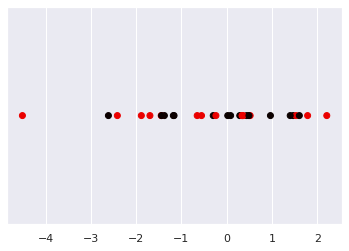

Clf Accuracy:  0.5666666666666667
Car
Proportion man:  0.3333333333333333
Proportion woman:  0.6666666666666666
man / woman 0.5
Predictions:  ['man' 'woman' 'man' 'woman' 'man' 'woman' 'woman' 'woman' 'man' 'woman'
 'woman' 'woman']
Probabilities:  [[0.5916979  0.40830213]
 [0.47406763 0.5259324 ]
 [0.53171754 0.46828246]
 [0.45783967 0.54216033]
 [0.6803558  0.3196442 ]
 [0.45329213 0.54670787]
 [0.32685828 0.6731417 ]
 [0.2202946  0.7797054 ]
 [0.61605465 0.38394532]
 [0.43206942 0.5679306 ]
 [0.49394304 0.50605696]
 [0.3994465  0.6005535 ]]
Refrig
Proportion man:  0.16666666666666666
Proportion woman:  0.8333333333333334
man / woman 0.2
Predictions:  ['woman' 'woman' 'woman' 'man' 'woman' 'man' 'woman' 'woman' 'woman'
 'woman' 'woman' 'woman' 'woman' 'woman' 'man' 'woman' 'woman' 'woman']
Probabilities:  [[0.32100958 0.6789904 ]
 [0.46703976 0.53296024]
 [0.1990704  0.8009296 ]
 [0.77014047 0.22985953]
 [0.29830527 0.7016947 ]
 [0.644981   0.35501894]
 [0.37868303 0.62131697]
 [0.40

In [1125]:
lda_transform(features_ieat_pt, all_ieat_labels, images_features_pt, comps_man_woman_targets, [car_pt, refrig_pt, surfb_pt], ['Car', 'Refrig', 'Surfb'])

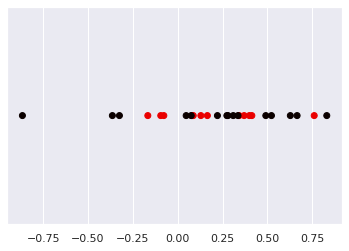

Clf Accuracy:  0.5555555555555556
Car
Proportion man:  0.25
Proportion woman:  0.75
man / woman 0.3333333333333333
Predictions:  ['woman' 'woman' 'man' 'woman' 'man' 'woman' 'woman' 'woman' 'woman' 'man'
 'woman' 'woman']
Probabilities:  [[0.40622908 0.5937709 ]
 [0.45895845 0.54104155]
 [0.5065762  0.49342385]
 [0.455536   0.544464  ]
 [0.53487563 0.4651244 ]
 [0.4270252  0.5729748 ]
 [0.45571858 0.5442814 ]
 [0.47763222 0.5223678 ]
 [0.46357167 0.53642833]
 [0.532637   0.46736297]
 [0.46835154 0.53164846]
 [0.484545   0.515455  ]]
Refrig
Proportion man:  0.2777777777777778
Proportion woman:  0.7222222222222222
man / woman 0.38461538461538464
Predictions:  ['woman' 'man' 'woman' 'man' 'woman' 'man' 'woman' 'man' 'man' 'woman'
 'woman' 'woman' 'woman' 'woman' 'woman' 'woman' 'woman' 'woman']
Probabilities:  [[0.44187838 0.5581216 ]
 [0.54231477 0.4576852 ]
 [0.4342044  0.5657956 ]
 [0.5276655  0.4723345 ]
 [0.40564376 0.59435624]
 [0.5401699  0.4598301 ]
 [0.43431735 0.56568265]
 [0.55

In [1126]:
lda_transform(images_features_pt, comps_man_woman_targets, man_woman_pt, targets_pt, [car_pt, refrig_pt, surfb_pt], ['Car', 'Refrig', 'Surfb'])


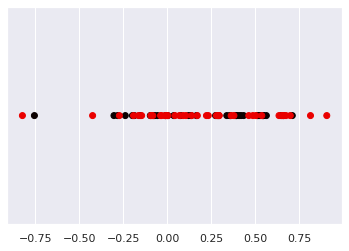

Clf Accuracy:  0.5125
Car
man / woman 0.3333333333333333
Predictions:  ['woman' 'woman' 'man' 'woman' 'man' 'woman' 'woman' 'woman' 'woman' 'man'
 'woman' 'woman']
Probabilities:  [[0.40622908 0.5937709 ]
 [0.45895845 0.54104155]
 [0.5065762  0.49342385]
 [0.455536   0.544464  ]
 [0.53487563 0.4651244 ]
 [0.4270252  0.5729748 ]
 [0.45571858 0.5442814 ]
 [0.47763222 0.5223678 ]
 [0.46357167 0.53642833]
 [0.532637   0.46736297]
 [0.46835154 0.53164846]
 [0.484545   0.515455  ]]
Refrig
man / woman 0.38461538461538464
Predictions:  ['woman' 'man' 'woman' 'man' 'woman' 'man' 'woman' 'man' 'man' 'woman'
 'woman' 'woman' 'woman' 'woman' 'woman' 'woman' 'woman' 'woman']
Probabilities:  [[0.44187838 0.5581216 ]
 [0.54231477 0.4576852 ]
 [0.4342044  0.5657956 ]
 [0.5276655  0.4723345 ]
 [0.40564376 0.59435624]
 [0.5401699  0.4598301 ]
 [0.43431735 0.56568265]
 [0.5565038  0.4434962 ]
 [0.51475906 0.48524097]
 [0.4245463  0.5754537 ]
 [0.43134922 0.5686508 ]
 [0.44546747 0.5545325 ]
 [0.45883292 

In [1116]:
lda_transform(images_features_pt, comps_man_woman_targets, features_ieat_pt, all_ieat_labels, [car_pt, refrig_pt, surfb_pt], ['Car', 'Refrig', 'Surfb'])


### Finetuning

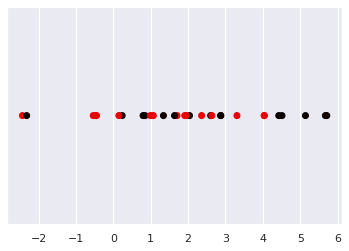

Clf Accuracy:  0.6
Car
man / woman 0.2
Predictions:  ['woman' 'man' 'woman' 'woman' 'woman' 'man' 'woman' 'woman' 'woman'
 'woman' 'woman' 'woman']
Probabilities:  [[3.8090962e-01 6.1909038e-01]
 [6.5144837e-01 3.4855160e-01]
 [0.0000000e+00 1.0000000e+00]
 [0.0000000e+00 1.0000000e+00]
 [7.2532892e-02 9.2746711e-01]
 [9.9984950e-01 1.5051947e-04]
 [1.3836622e-03 9.9861634e-01]
 [6.2769651e-04 9.9937230e-01]
 [2.9087067e-05 9.9997091e-01]
 [0.0000000e+00 1.0000000e+00]
 [0.0000000e+00 1.0000000e+00]
 [5.0067902e-05 9.9994993e-01]]
Refrig
man / woman 0.0
Predictions:  ['woman' 'woman' 'woman' 'woman' 'woman' 'woman' 'woman' 'woman' 'woman'
 'woman' 'woman' 'woman' 'woman' 'woman' 'woman' 'woman' 'woman' 'woman']
Probabilities:  [[0.0000000e+00 1.0000000e+00]
 [3.5762787e-07 9.9999964e-01]
 [0.0000000e+00 1.0000000e+00]
 [2.3841858e-07 9.9999976e-01]
 [0.0000000e+00 1.0000000e+00]
 [2.0265579e-06 9.9999797e-01]
 [0.0000000e+00 1.0000000e+00]
 [0.0000000e+00 1.0000000e+00]
 [0.0000000e+00

In [1117]:
lda_transform(features_ieat_ft, all_ieat_labels, images_features_ft, comps_man_woman_targets, [car_ft, refrig_ft, surfb_ft], ['Car', 'Refrig', 'Surfb'])





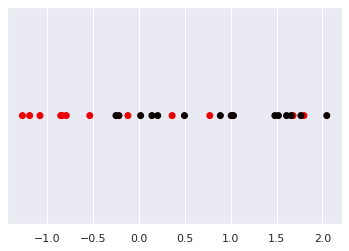

Clf Accuracy:  0.7777777777777778
Car
Proportion man:  0.08333333333333333
Proportion woman:  0.9166666666666666
man / woman 0.09090909090909091
Predictions:  ['woman' 'woman' 'woman' 'woman' 'man' 'woman' 'woman' 'woman' 'woman'
 'woman' 'woman' 'woman']
Probabilities:  [[0.2513082  0.7486918 ]
 [0.2291429  0.7708571 ]
 [0.03298163 0.96701837]
 [0.35281408 0.6471859 ]
 [0.72584635 0.27415365]
 [0.19936323 0.80063677]
 [0.22490543 0.77509457]
 [0.22833359 0.7716664 ]
 [0.24735332 0.7526467 ]
 [0.10976487 0.8902351 ]
 [0.08696616 0.91303384]
 [0.09093934 0.90906066]]
Refrig
Proportion man:  0.2222222222222222
Proportion woman:  0.7777777777777778
man / woman 0.2857142857142857
Predictions:  ['woman' 'woman' 'woman' 'woman' 'woman' 'man' 'woman' 'man' 'woman'
 'woman' 'man' 'woman' 'man' 'woman' 'woman' 'woman' 'woman' 'woman']
Probabilities:  [[0.4024672  0.5975328 ]
 [0.42127436 0.57872564]
 [0.31778204 0.68221796]
 [0.437885   0.562115  ]
 [0.36625355 0.63374645]
 [0.52888536 0.471114

In [1127]:
lda_transform(images_features_ft, comps_man_woman_targets, man_woman_ft, targets_ft, [car_ft, refrig_ft, surfb_ft], ['Car', 'Refrig', 'Surfb'])






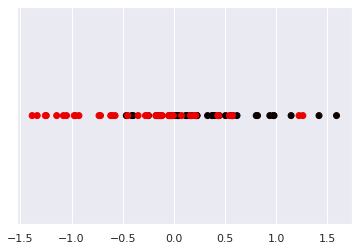

Clf Accuracy:  0.7375
Car
Proportion man:  0.08333333333333333
Proportion woman:  0.9166666666666666
man / woman 0.09090909090909091
Predictions:  ['woman' 'woman' 'woman' 'woman' 'man' 'woman' 'woman' 'woman' 'woman'
 'woman' 'woman' 'woman']
Probabilities:  [[0.2513082  0.7486918 ]
 [0.2291429  0.7708571 ]
 [0.03298163 0.96701837]
 [0.35281408 0.6471859 ]
 [0.72584635 0.27415365]
 [0.19936323 0.80063677]
 [0.22490543 0.77509457]
 [0.22833359 0.7716664 ]
 [0.24735332 0.7526467 ]
 [0.10976487 0.8902351 ]
 [0.08696616 0.91303384]
 [0.09093934 0.90906066]]
Refrig
Proportion man:  0.2222222222222222
Proportion woman:  0.7777777777777778
man / woman 0.2857142857142857
Predictions:  ['woman' 'woman' 'woman' 'woman' 'woman' 'man' 'woman' 'man' 'woman'
 'woman' 'man' 'woman' 'man' 'woman' 'woman' 'woman' 'woman' 'woman']
Probabilities:  [[0.4024672  0.5975328 ]
 [0.42127436 0.57872564]
 [0.31778204 0.68221796]
 [0.437885   0.562115  ]
 [0.36625355 0.63374645]
 [0.52888536 0.4711146 ]
 [0.4924

In [1128]:
lda_transform(images_features_ft, comps_man_woman_targets, features_ieat_ft, all_ieat_labels, [car_ft, refrig_ft, surfb_ft], ['Car', 'Refrig', 'Surfb'])




In [1055]:
woman_transformed = transformed[:40]
man_transformed = transformed[40:]
print(min(woman_transformed), max(woman_transformed))
print(min(man_transformed), max(man_transformed))
plt.boxplot((np.squeeze(woman_transformed), np.squeeze(man_transformed)))

[-1.08803666] [1.45055273]
[-2.08646487] [2.65612532]


# PCA

In [846]:
from sklearn.preprocessing import StandardScaler
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
from sklearn.decomposition import PCA
import pandas as pd

from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances


In [833]:
from matplotlib import cm
cmap=plt.get_cmap('plasma')

In [834]:
cmap = plt.cm.get_cmap('Spectral')
rgba = cmap(np.linspace(0, 1, 30))

In [994]:
def pca_transform(diffvecs, data, targets):
    
    #diffvecs = StandardScaler().fit_transform(diffvecs)
    pca = PCA()
    pca.fit(diffvecs)
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('number of components')
    plt.ylabel('cumulative explained variance')

    print(pca.explained_variance_)

    X = pca.transform(data)

    principalDf = pd.DataFrame(data = X[:, :2], columns = ['principal component 1', 'principal component 2'])
    principalDf['target'] = targets
    
    return principalDf


def plot_man_woman(df, title = '2 component PCA'):
    fig = plt.figure(figsize = (8,8))
    ax = fig.add_subplot(1,1,1) 
    ax.set_xlabel('Principal Component 1', fontsize = 15)
    ax.set_ylabel('Principal Component 2', fontsize = 15)
    ax.set_title(title, fontsize = 20)
    targets = ['man', 'woman']
    colors = ['g', 'b']

    for target, color in zip(targets,colors):
        indicesToKeep = df['target'] == target
        ax.scatter(df.loc[indicesToKeep, 'principal component 1']
                   , df.loc[indicesToKeep, 'principal component 2']
                   , c = color
                   , s = 50)
    ax.legend(targets)
    ax.grid()
    
def plot_comps(df, title='2 component PCA'):
    fig = plt.figure(figsize = (8,8))
    ax = fig.add_subplot(1,1,1) 
    ax.set_xlabel('Principal Component 1', fontsize = 15)
    ax.set_ylabel('Principal Component 2', fontsize = 15)
    ax.set_title(title, fontsize = 20)
    targets = ['car+man', 'car+woman', 'surfb+man', 'surfb+woman', 'refrig+man', 'refrig+woman', 'burger+man', 'burger+woman', 'soccer+man', 'soccer+woman', 'sing+man', 'sing+woman', 'read+man', 'read+woman', 'run+man', 'run+woman', 
                'computer+man', 'computer+woman', 'drive+man', 'drive+woman', 'tower+man', 'tower+woman']
    cmap = plt.cm.get_cmap('Spectral')
    print("targets: ", len(targets))

    colors = cmap(np.linspace(0, 1, len(targets)))
    
    #colors = ['r', 'g', 'b', 'orange', 'magenta', 'yellow']
    

    for target, color in zip(targets,colors):
        indicesToKeep = df['target'] == target
        ax.scatter(df.loc[indicesToKeep, 'principal component 1']
                   , df.loc[indicesToKeep, 'principal component 2']
                   , c = color
                   , s = 50)
    ax.legend(targets)
    ax.grid()
    
def plot_cats(df, title='2 component PCA'):
    fig = plt.figure(figsize = (8,8))
    ax = fig.add_subplot(1,1,1) 
    ax.set_xlabel('Principal Component 1', fontsize = 15)
    ax.set_ylabel('Principal Component 2', fontsize = 15)
    ax.set_title(title, fontsize = 20)
    targets = ['man', 'woman', 'surfb', 'refrig', 'car']
    #cmap = plt.cm.get_cmap('Spectral')
    #print("targets: ", len(targets))

    #colors = cmap(np.linspace(0, 1, len(targets)))
    
    colors = ['r', 'g', 'b', 'orange', 'magenta']
    markers = ['o', 'o', '*', 'v', '1']
    counter = 0
    

    for target, color in zip(targets,colors):
        indicesToKeep = df['target'] == target

        ax.scatter(df.loc[indicesToKeep, 'principal component 1']
                   , df.loc[indicesToKeep, 'principal component 2']
                   , c = color
                   , marker=markers[counter]
                   , s = 50)
        counter+=1
    ax.legend(targets)
    ax.grid()
    
    
def cosine_similarity_fx(a, b):
    a = np.array(a)
    b = np.array(b)
    a = np.reshape(a, (1,-1))
    b = np.reshape(b, (1,-1))
    similarity = cosine_similarity(a, b)
    print("Similarity: ", similarity)
    print("Mean similarity: ", np.mean(similarity))

[7.92137081e-02 7.06458672e-02 5.72853133e-02 5.38798005e-02
 4.95840757e-02 4.74702259e-02 4.22904404e-02 3.93583601e-02
 3.62233676e-02 3.40126848e-02 3.22478891e-02 3.13425385e-02
 3.03016846e-02 2.82389994e-02 2.75606933e-02 2.60419350e-02
 2.52973951e-02 2.27189811e-02 2.23758930e-02 2.16814674e-02
 2.01893891e-02 1.94172923e-02 1.87308927e-02 1.75982012e-02
 1.71415294e-02 1.63596398e-02 1.56213570e-02 1.51914074e-02
 1.41772357e-02 1.33797598e-02 1.28971935e-02 1.24015839e-02
 1.18200092e-02 1.15937434e-02 9.83995998e-03 9.51752778e-03
 8.86505190e-03 8.14754606e-04 7.79740469e-04 1.56221494e-32]


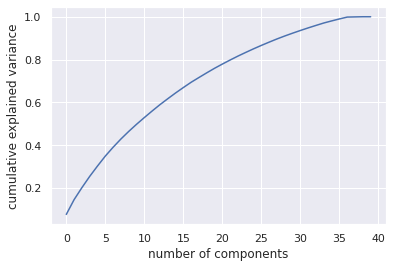

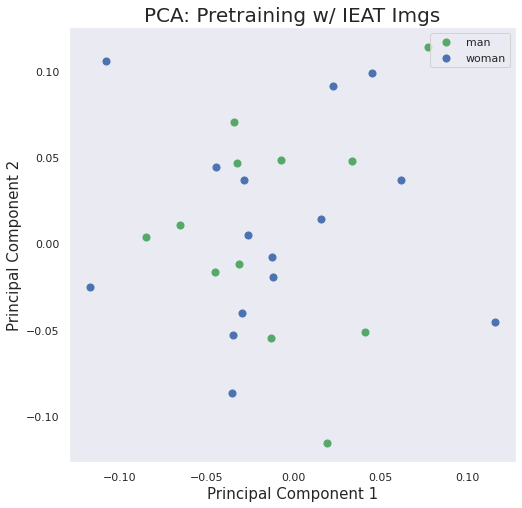

In [973]:
#diff_pt_ieat, features_ieat_pt, all_ieat_labels

df_pt = pca_transform(diff_pt_ieat, man_woman_pt, targets_pt)
plot_man_woman(df_pt, title='PCA: Pretraining w/ IEAT Imgs')

[1.24070610e-01 1.00012964e-01 9.16814918e-02 7.81231252e-02
 7.61838079e-02 7.26133223e-02 6.85866029e-02 6.51351488e-02
 6.33445773e-02 5.76554585e-02 5.23350400e-02 4.86350743e-02
 4.72938129e-02 3.13800310e-02 2.63441938e-32]


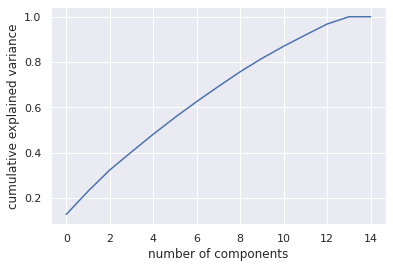

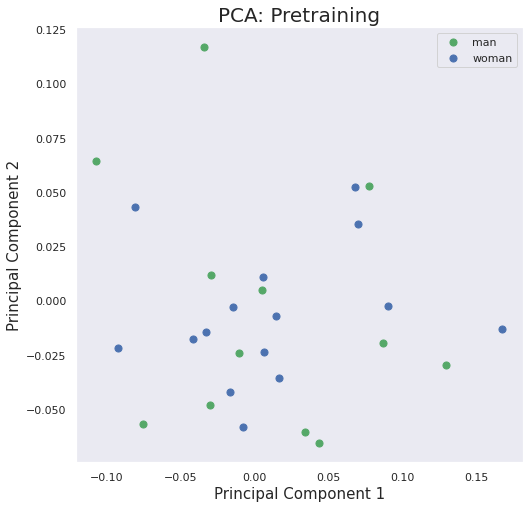

In [995]:
df_pt = pca_transform(diff_pt, man_woman_pt, targets_pt)
plot_man_woman(df_pt, title='PCA: Pretraining')


[1.89089732e-01 9.10645822e-02 6.73825464e-02 4.84228748e-02
 4.25449723e-02 3.99835123e-02 3.86668499e-02 3.54445910e-02
 2.96671981e-02 2.68368531e-02 2.34278808e-02 2.00230166e-02
 1.84158726e-02 1.51075826e-02 1.33612503e-02 1.25796677e-02
 1.13825521e-02 1.01434598e-02 9.36157382e-03 8.82870461e-03
 8.32575933e-03 8.13012606e-03 7.27805831e-03 6.48669887e-03
 5.71773952e-03 5.56332785e-03 5.37943061e-03 5.30339445e-03
 4.56392108e-03 4.15252498e-03 4.06917431e-03 3.99740050e-03
 3.43760513e-03 3.03823361e-03 2.94148922e-03 2.56379606e-03
 2.32720653e-03 2.09970425e-03 1.74790369e-03 3.72913743e-32]


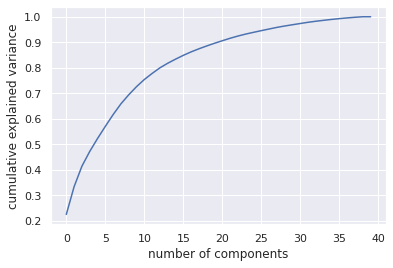

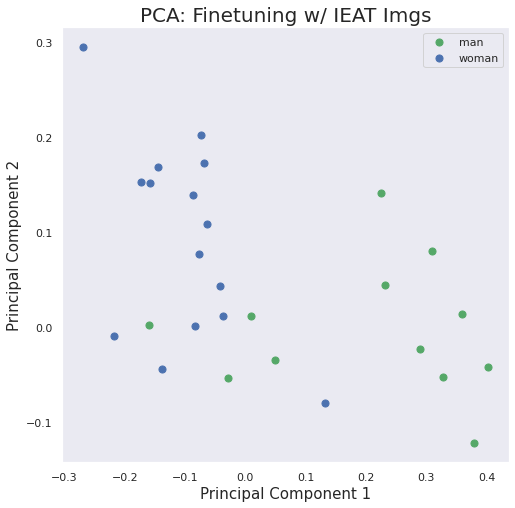

In [975]:
#diff_pt_ieat, features_ieat_pt, all_ieat_labels
df_ft = pca_transform(diff_ft_ieat, man_woman_ft, targets_ft)
plot_man_woman(df_ft, title='PCA: Finetuning w/ IEAT Imgs')

[1.21267438e-01 1.08427233e-01 9.65994099e-02 8.77393245e-02
 7.58784505e-02 7.16084489e-02 6.57873835e-02 6.36421288e-02
 5.70907663e-02 5.10915911e-02 4.70744004e-02 4.40709774e-02
 3.63514421e-02 2.40150176e-02 1.40008737e-32]


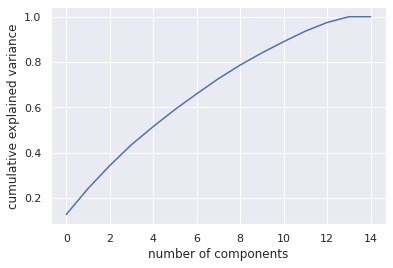

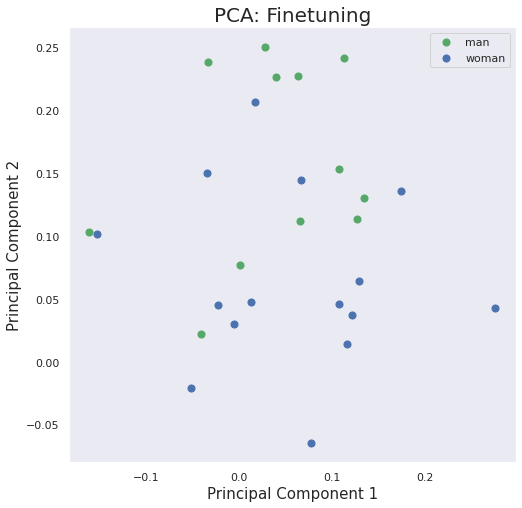

In [996]:
df_ft = pca_transform(diff_ft, man_woman_ft, targets_ft)
plot_man_woman(df_ft, title='PCA: Finetuning')

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

[1.19947925e-01 1.02439247e-01 9.06885586e-02 8.84111116e-02
 7.54106840e-02 7.22560370e-02 7.00739128e-02 6.56534365e-02
 6.28885507e-02 5.96510767e-02 5.56161837e-02 5.01076736e-02
 4.62081491e-02 4.51960339e-02 2.99341674e-02 7.82412279e-16
 7.22451493e-16 6.32141312e-16 6.01150112e-16 5.33174520e-16
 5.20414812e-16 5.04524341e-16 4.81379396e-16 4.48711974e-16
 4.20651235e-16 4.07774977e-16 3.92149847e-16 3.61428587e-16
 3.53695585e-16 3.57001530e-33]
targets:  22
[1.34747706e-01 1.15456397e-01 1.04318887e-01 8.52048189e-02
 8.24296946e-02 7.08419024e-02 6.82603999e-02 6.24823087e-02
 6.14460595e-02 5.50307602e-02 4.91118188e-02 4.48753348e-02
 4.24266084e-02 3.50518765e-02 2.27981827e-02 2.36175121e-15
 2.07311381e-15 1.71243250e-15 1.50519528e-15 1.31644410e-15
 1.01635110e-15 9.42873314e-16 8.57063962e-16 8.08685794e-16
 6.97273523e-16 6.65036425e-16 5.98643647e-16 5.79029010e-16
 5.32839000e-16 4.09033926e-33]


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

targets:  22


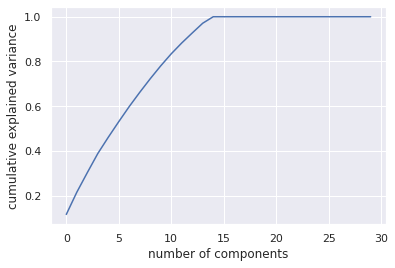

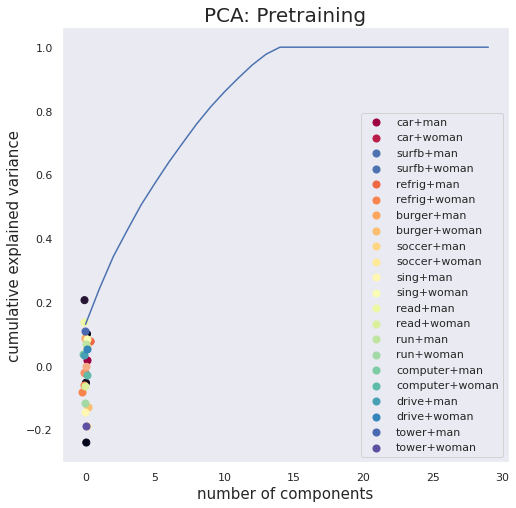

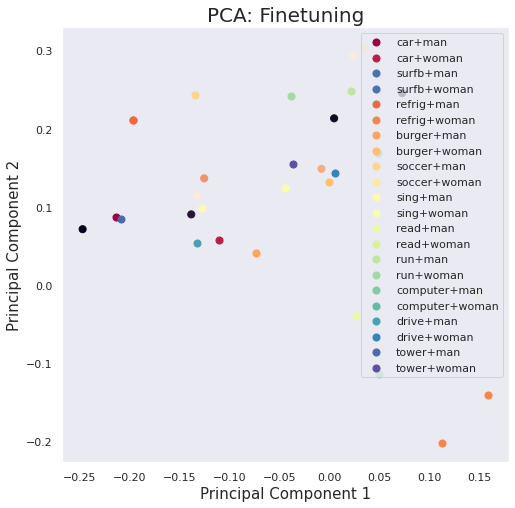

In [976]:
df_pt = pca_transform(diff_pt, images_features_pt, comps_targets)
plot_comps(df_pt, title='PCA: Pretraining')

df_ft = pca_transform(diff_ft, images_features_ft, comps_targets)
plot_comps(df_ft, title='PCA: Finetuning')

[7.92137081e-02 7.06458672e-02 5.72853133e-02 5.38798005e-02
 4.95840757e-02 4.74702259e-02 4.22904404e-02 3.93583601e-02
 3.62233676e-02 3.40126848e-02 3.22478891e-02 3.13425385e-02
 3.03016846e-02 2.82389994e-02 2.75606933e-02 2.60419350e-02
 2.52973951e-02 2.27189811e-02 2.23758930e-02 2.16814674e-02
 2.01893891e-02 1.94172923e-02 1.87308927e-02 1.75982012e-02
 1.71415294e-02 1.63596398e-02 1.56213570e-02 1.51914074e-02
 1.41772357e-02 1.33797598e-02 1.28971935e-02 1.24015839e-02
 1.18200092e-02 1.15937434e-02 9.83995998e-03 9.51752778e-03
 8.86505190e-03 8.14754606e-04 7.79740469e-04 1.56221494e-32]


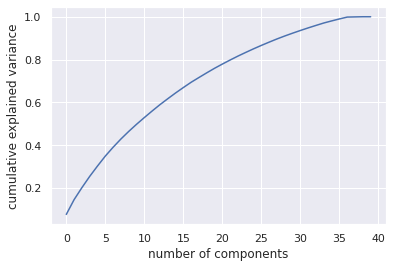

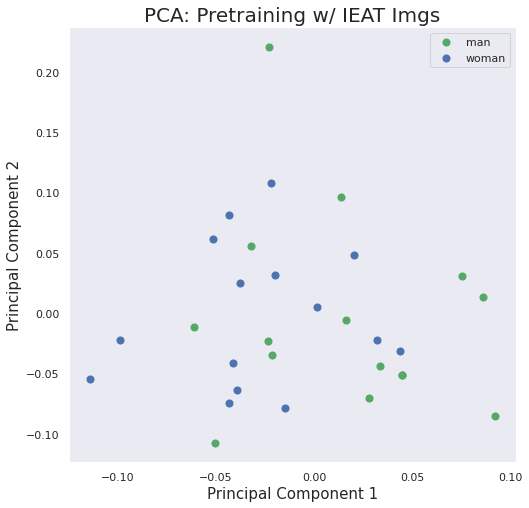

In [977]:
#diff_pt_ieat, features_ieat_pt, all_ieat_labels

df_pt = pca_transform(diff_pt_ieat, images_features_pt, comps_man_woman_targets)
plot_man_woman(df_pt, title='PCA: Pretraining w/ IEAT Imgs')


[1.19947925e-01 1.02439247e-01 9.06885586e-02 8.84111116e-02
 7.54106840e-02 7.22560370e-02 7.00739128e-02 6.56534365e-02
 6.28885507e-02 5.96510767e-02 5.56161837e-02 5.01076736e-02
 4.62081491e-02 4.51960339e-02 2.99341674e-02 7.82412279e-16
 7.22451493e-16 6.32141312e-16 6.01150112e-16 5.33174520e-16
 5.20414812e-16 5.04524341e-16 4.81379396e-16 4.48711974e-16
 4.20651235e-16 4.07774977e-16 3.92149847e-16 3.61428587e-16
 3.53695585e-16 3.57001530e-33]


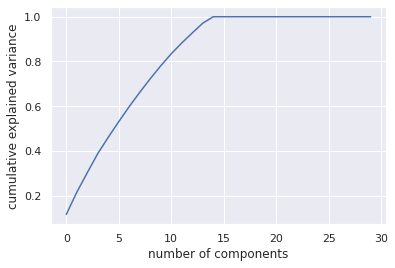

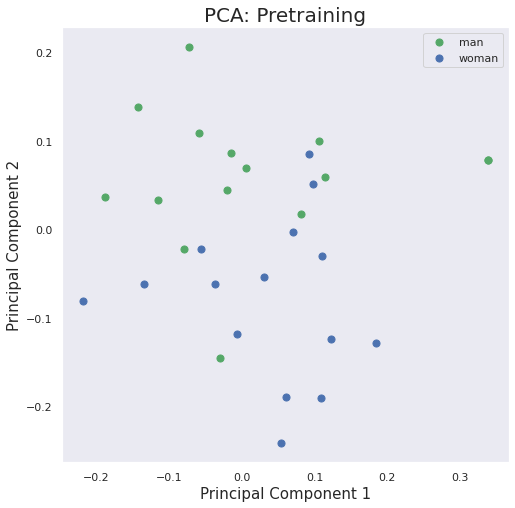

In [883]:

df_pt = pca_transform(diff_pt, images_features_pt, comps_man_woman_targets)
plot_man_woman(df_pt, title='PCA: Pretraining')

[1.89089732e-01 9.10645822e-02 6.73825464e-02 4.84228748e-02
 4.25449723e-02 3.99835123e-02 3.86668499e-02 3.54445910e-02
 2.96671981e-02 2.68368531e-02 2.34278808e-02 2.00230166e-02
 1.84158726e-02 1.51075826e-02 1.33612503e-02 1.25796677e-02
 1.13825521e-02 1.01434598e-02 9.36157382e-03 8.82870461e-03
 8.32575933e-03 8.13012606e-03 7.27805831e-03 6.48669887e-03
 5.71773952e-03 5.56332785e-03 5.37943061e-03 5.30339445e-03
 4.56392108e-03 4.15252498e-03 4.06917431e-03 3.99740050e-03
 3.43760513e-03 3.03823361e-03 2.94148922e-03 2.56379606e-03
 2.32720653e-03 2.09970425e-03 1.74790369e-03 3.72913743e-32]


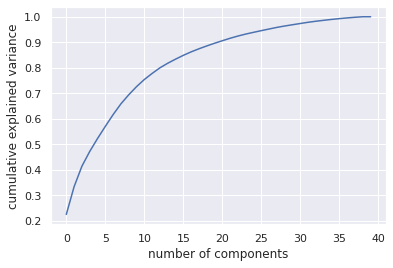

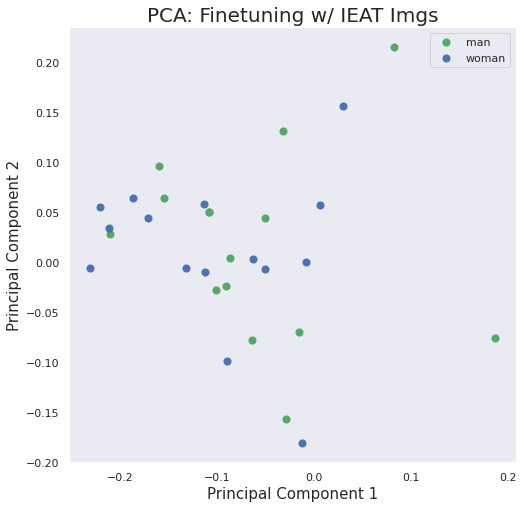

In [978]:
#diff_pt_ieat, features_ieat_pt, all_ieat_labels
df_ft = pca_transform(diff_ft_ieat, images_features_ft, comps_man_woman_targets)
plot_man_woman(df_ft, title='PCA: Finetuning w/ IEAT Imgs')


[1.34747706e-01 1.15456397e-01 1.04318887e-01 8.52048189e-02
 8.24296946e-02 7.08419024e-02 6.82603999e-02 6.24823087e-02
 6.14460595e-02 5.50307602e-02 4.91118188e-02 4.48753348e-02
 4.24266084e-02 3.50518765e-02 2.27981827e-02 2.36175121e-15
 2.07311381e-15 1.71243250e-15 1.50519528e-15 1.31644410e-15
 1.01635110e-15 9.42873314e-16 8.57063962e-16 8.08685794e-16
 6.97273523e-16 6.65036425e-16 5.98643647e-16 5.79029010e-16
 5.32839000e-16 4.09033926e-33]


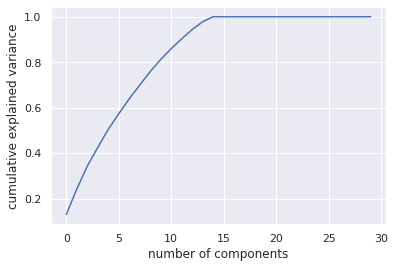

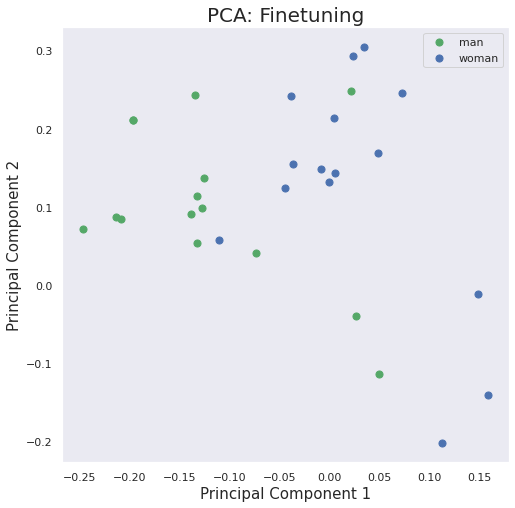

In [884]:


df_ft = pca_transform(diff_ft, images_features_ft, comps_man_woman_targets)
plot_man_woman(df_ft, title='PCA: Finetuning')

[7.92137081e-02 7.06458672e-02 5.72853133e-02 5.38798005e-02
 4.95840757e-02 4.74702259e-02 4.22904404e-02 3.93583601e-02
 3.62233676e-02 3.40126848e-02 3.22478891e-02 3.13425385e-02
 3.03016846e-02 2.82389994e-02 2.75606933e-02 2.60419350e-02
 2.52973951e-02 2.27189811e-02 2.23758930e-02 2.16814674e-02
 2.01893891e-02 1.94172923e-02 1.87308927e-02 1.75982012e-02
 1.71415294e-02 1.63596398e-02 1.56213570e-02 1.51914074e-02
 1.41772357e-02 1.33797598e-02 1.28971935e-02 1.24015839e-02
 1.18200092e-02 1.15937434e-02 9.83995998e-03 9.51752778e-03
 8.86505190e-03 8.14754606e-04 7.79740469e-04 1.56221494e-32]


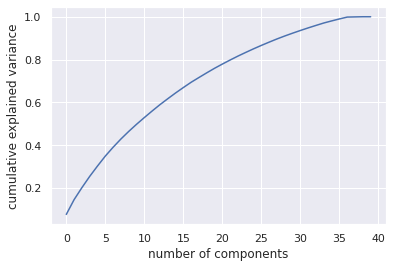

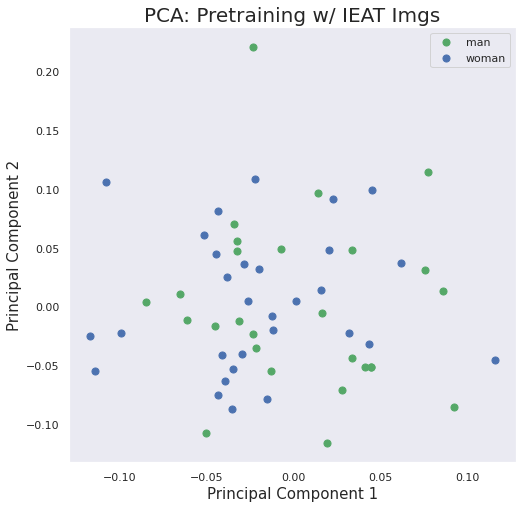

In [979]:
#diff_pt_ieat, features_ieat_pt, all_ieat_labels


df_pt = pca_transform(diff_pt_ieat, comps_gender_imgs, comps_gender_targets)
plot_man_woman(df_pt, title='PCA: Pretraining w/ IEAT Imgs')


[1.19947925e-01 1.02439247e-01 9.06885586e-02 8.84111116e-02
 7.54106840e-02 7.22560370e-02 7.00739128e-02 6.56534365e-02
 6.28885507e-02 5.96510767e-02 5.56161837e-02 5.01076736e-02
 4.62081491e-02 4.51960339e-02 2.99341674e-02 7.82412279e-16
 7.22451493e-16 6.32141312e-16 6.01150112e-16 5.33174520e-16
 5.20414812e-16 5.04524341e-16 4.81379396e-16 4.48711974e-16
 4.20651235e-16 4.07774977e-16 3.92149847e-16 3.61428587e-16
 3.53695585e-16 3.57001530e-33]


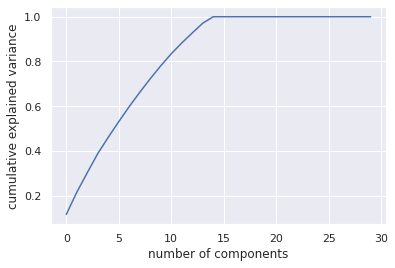

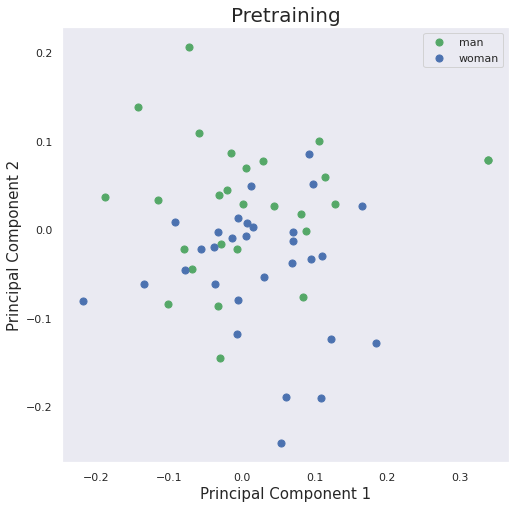

In [885]:

df_pt = pca_transform(diff_pt, comps_gender_imgs, comps_gender_targets)
plot_man_woman(df_pt, title='PCA: Pretraining')

[1.34747706e-01 1.15456397e-01 1.04318887e-01 8.52048189e-02
 8.24296946e-02 7.08419024e-02 6.82603999e-02 6.24823087e-02
 6.14460595e-02 5.50307602e-02 4.91118188e-02 4.48753348e-02
 4.24266084e-02 3.50518765e-02 2.27981827e-02 2.36175121e-15
 2.07311381e-15 1.71243250e-15 1.50519528e-15 1.31644410e-15
 1.01635110e-15 9.42873314e-16 8.57063962e-16 8.08685794e-16
 6.97273523e-16 6.65036425e-16 5.98643647e-16 5.79029010e-16
 5.32839000e-16 4.09033926e-33]


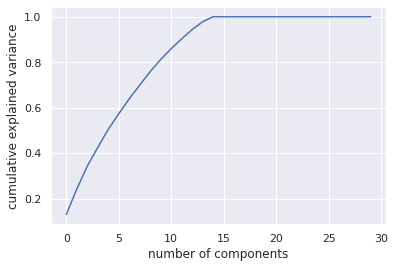

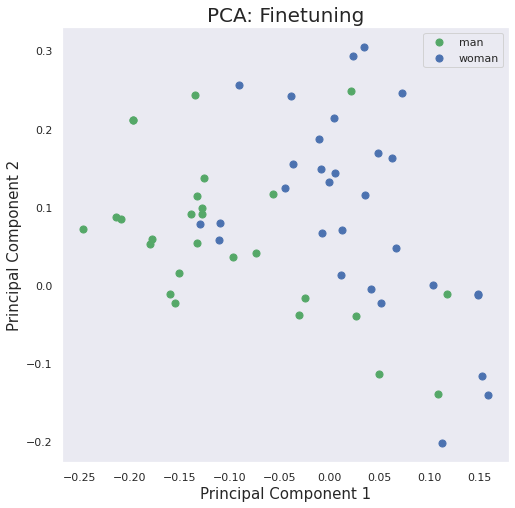

In [886]:


df_ft = pca_transform(diff_ft, comps_gender_imgs_ft, comps_gender_targets)
plot_man_woman(df_ft, title='PCA: Finetuning')

[1.89089732e-01 9.10645822e-02 6.73825464e-02 4.84228748e-02
 4.25449723e-02 3.99835123e-02 3.86668499e-02 3.54445910e-02
 2.96671981e-02 2.68368531e-02 2.34278808e-02 2.00230166e-02
 1.84158726e-02 1.51075826e-02 1.33612503e-02 1.25796677e-02
 1.13825521e-02 1.01434598e-02 9.36157382e-03 8.82870461e-03
 8.32575933e-03 8.13012606e-03 7.27805831e-03 6.48669887e-03
 5.71773952e-03 5.56332785e-03 5.37943061e-03 5.30339445e-03
 4.56392108e-03 4.15252498e-03 4.06917431e-03 3.99740050e-03
 3.43760513e-03 3.03823361e-03 2.94148922e-03 2.56379606e-03
 2.32720653e-03 2.09970425e-03 1.74790369e-03 3.72913743e-32]


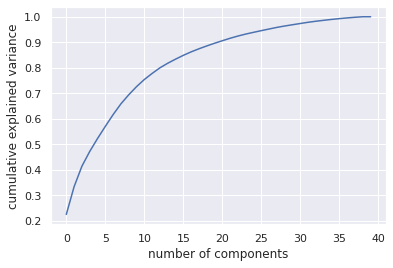

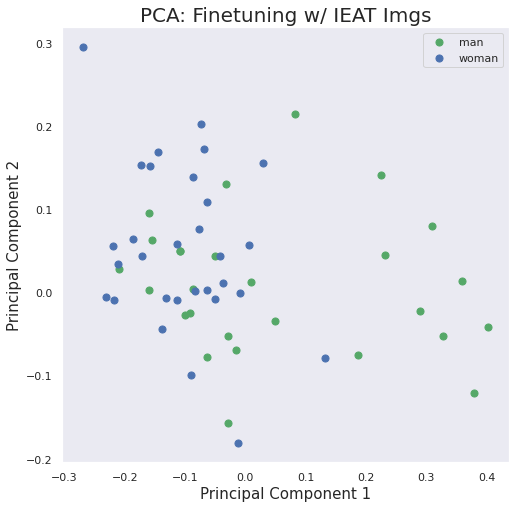

In [981]:
#diff_pt_ieat, features_ieat_pt, all_ieat_labels


df_ft = pca_transform(diff_ft_ieat, comps_gender_imgs_ft, comps_gender_targets)
plot_man_woman(df_ft, title='PCA: Finetuning w/ IEAT Imgs')


[1.19947925e-01 1.02439247e-01 9.06885586e-02 8.84111116e-02
 7.54106840e-02 7.22560370e-02 7.00739128e-02 6.56534365e-02
 6.28885507e-02 5.96510767e-02 5.56161837e-02 5.01076736e-02
 4.62081491e-02 4.51960339e-02 2.99341674e-02 7.82412279e-16
 7.22451493e-16 6.32141312e-16 6.01150112e-16 5.33174520e-16
 5.20414812e-16 5.04524341e-16 4.81379396e-16 4.48711974e-16
 4.20651235e-16 4.07774977e-16 3.92149847e-16 3.61428587e-16
 3.53695585e-16 3.57001530e-33]


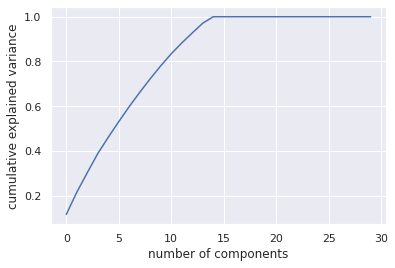

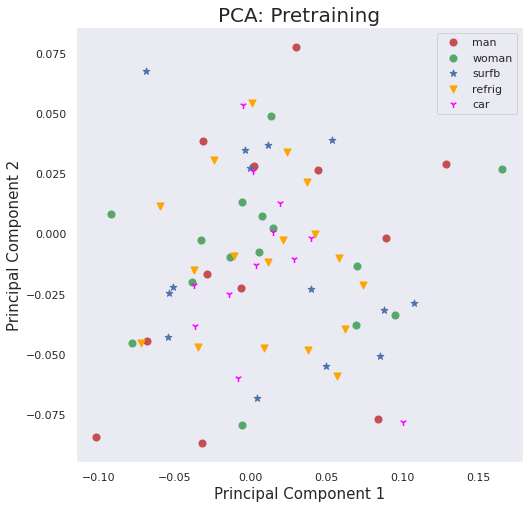

In [887]:

df_pt = pca_transform(diff_pt, cats_gender_pt, targets_pt_cats)
plot_cats(df_pt, title='PCA: Pretraining')

[7.92137081e-02 7.06458672e-02 5.72853133e-02 5.38798005e-02
 4.95840757e-02 4.74702259e-02 4.22904404e-02 3.93583601e-02
 3.62233676e-02 3.40126848e-02 3.22478891e-02 3.13425385e-02
 3.03016846e-02 2.82389994e-02 2.75606933e-02 2.60419350e-02
 2.52973951e-02 2.27189811e-02 2.23758930e-02 2.16814674e-02
 2.01893891e-02 1.94172923e-02 1.87308927e-02 1.75982012e-02
 1.71415294e-02 1.63596398e-02 1.56213570e-02 1.51914074e-02
 1.41772357e-02 1.33797598e-02 1.28971935e-02 1.24015839e-02
 1.18200092e-02 1.15937434e-02 9.83995998e-03 9.51752778e-03
 8.86505190e-03 8.14754606e-04 7.79740469e-04 1.56221494e-32]


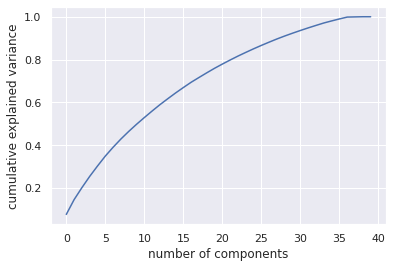

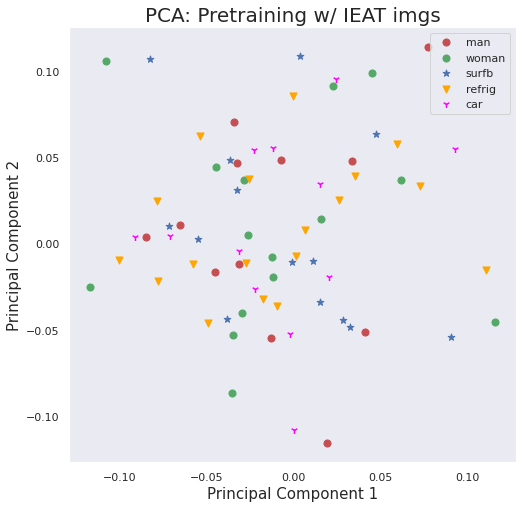

In [982]:
df_pt = pca_transform(diff_pt_ieat, cats_gender_pt, targets_pt_cats)
plot_cats(df_pt, title='PCA: Pretraining w/ IEAT imgs')

[1.34747706e-01 1.15456397e-01 1.04318887e-01 8.52048189e-02
 8.24296946e-02 7.08419024e-02 6.82603999e-02 6.24823087e-02
 6.14460595e-02 5.50307602e-02 4.91118188e-02 4.48753348e-02
 4.24266084e-02 3.50518765e-02 2.27981827e-02 2.36175121e-15
 2.07311381e-15 1.71243250e-15 1.50519528e-15 1.31644410e-15
 1.01635110e-15 9.42873314e-16 8.57063962e-16 8.08685794e-16
 6.97273523e-16 6.65036425e-16 5.98643647e-16 5.79029010e-16
 5.32839000e-16 4.09033926e-33]


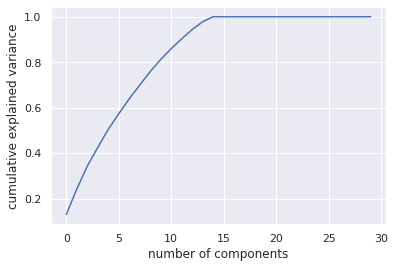

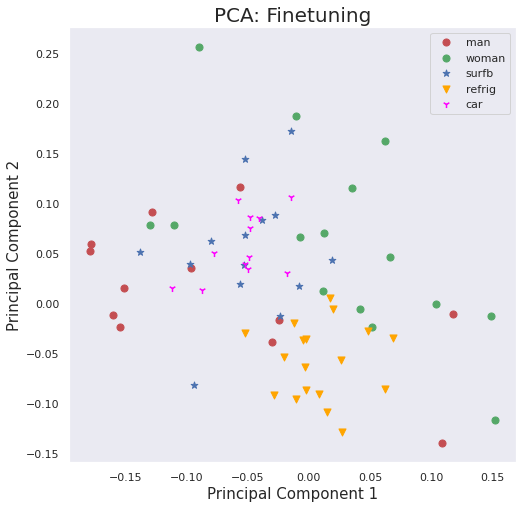

In [888]:

df_ft = pca_transform(diff_ft, cats_gender_ft, targets_ft_cats)
plot_cats(df_ft, title='PCA: Finetuning')

[1.89089732e-01 9.10645822e-02 6.73825464e-02 4.84228748e-02
 4.25449723e-02 3.99835123e-02 3.86668499e-02 3.54445910e-02
 2.96671981e-02 2.68368531e-02 2.34278808e-02 2.00230166e-02
 1.84158726e-02 1.51075826e-02 1.33612503e-02 1.25796677e-02
 1.13825521e-02 1.01434598e-02 9.36157382e-03 8.82870461e-03
 8.32575933e-03 8.13012606e-03 7.27805831e-03 6.48669887e-03
 5.71773952e-03 5.56332785e-03 5.37943061e-03 5.30339445e-03
 4.56392108e-03 4.15252498e-03 4.06917431e-03 3.99740050e-03
 3.43760513e-03 3.03823361e-03 2.94148922e-03 2.56379606e-03
 2.32720653e-03 2.09970425e-03 1.74790369e-03 3.72913743e-32]


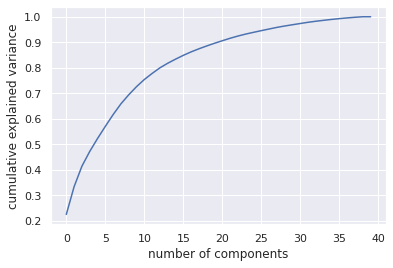

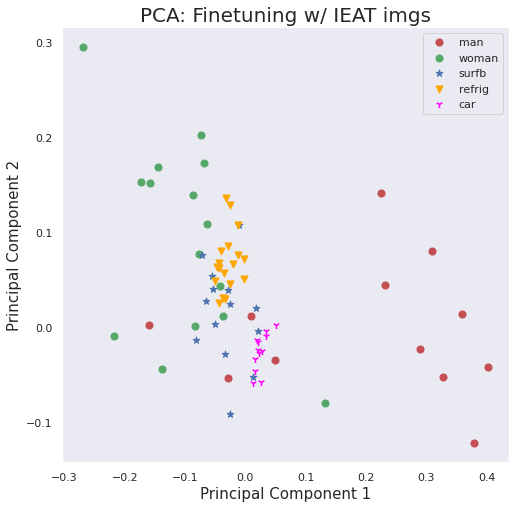

In [983]:
df_ft = pca_transform(diff_ft_ieat, cats_gender_ft, targets_ft_cats)
plot_cats(df_ft, title='PCA: Finetuning w/ IEAT imgs')

[7.92137081e-02 7.06458672e-02 5.72853133e-02 5.38798005e-02
 4.95840757e-02 4.74702259e-02 4.22904404e-02 3.93583601e-02
 3.62233676e-02 3.40126848e-02 3.22478891e-02 3.13425385e-02
 3.03016846e-02 2.82389994e-02 2.75606933e-02 2.60419350e-02
 2.52973951e-02 2.27189811e-02 2.23758930e-02 2.16814674e-02
 2.01893891e-02 1.94172923e-02 1.87308927e-02 1.75982012e-02
 1.71415294e-02 1.63596398e-02 1.56213570e-02 1.51914074e-02
 1.41772357e-02 1.33797598e-02 1.28971935e-02 1.24015839e-02
 1.18200092e-02 1.15937434e-02 9.83995998e-03 9.51752778e-03
 8.86505190e-03 8.14754606e-04 7.79740469e-04 1.56221494e-32]


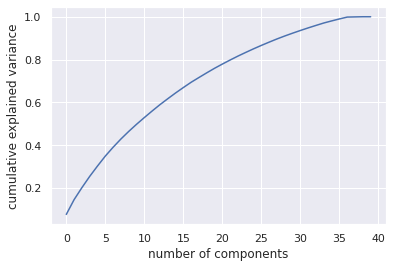

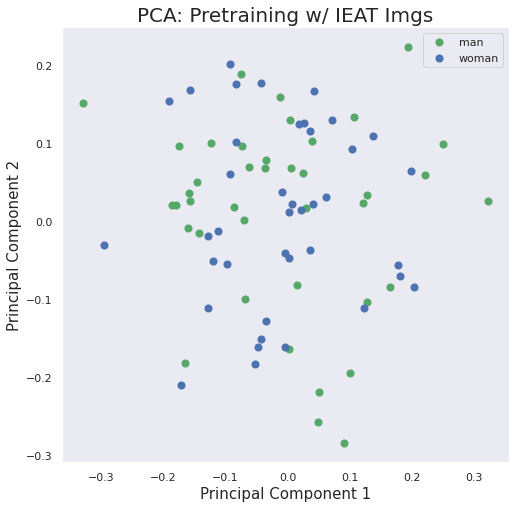

In [989]:
#diff_pt_ieat, features_ieat_pt, all_ieat_labels


df_pt = pca_transform(diff_pt_ieat, features_ieat_pt, all_ieat_labels)
plot_man_woman(df_pt, title='PCA: Pretraining w/ IEAT Imgs')

[1.89089732e-01 9.10645822e-02 6.73825464e-02 4.84228748e-02
 4.25449723e-02 3.99835123e-02 3.86668499e-02 3.54445910e-02
 2.96671981e-02 2.68368531e-02 2.34278808e-02 2.00230166e-02
 1.84158726e-02 1.51075826e-02 1.33612503e-02 1.25796677e-02
 1.13825521e-02 1.01434598e-02 9.36157382e-03 8.82870461e-03
 8.32575933e-03 8.13012606e-03 7.27805831e-03 6.48669887e-03
 5.71773952e-03 5.56332785e-03 5.37943061e-03 5.30339445e-03
 4.56392108e-03 4.15252498e-03 4.06917431e-03 3.99740050e-03
 3.43760513e-03 3.03823361e-03 2.94148922e-03 2.56379606e-03
 2.32720653e-03 2.09970425e-03 1.74790369e-03 3.72913743e-32]


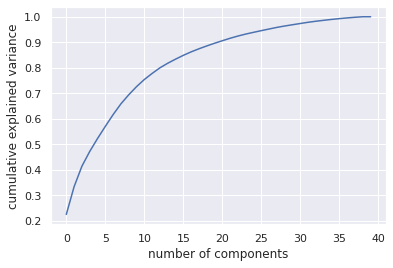

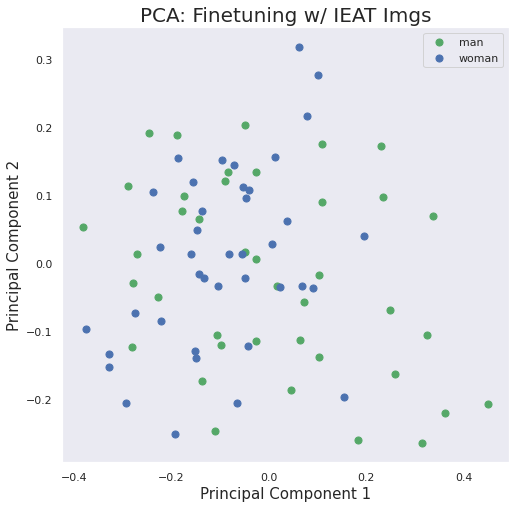

In [990]:
#diff_pt_ieat, features_ieat_pt, all_ieat_labels


df_ft = pca_transform(diff_ft_ieat, features_ieat_ft, all_ieat_labels)
plot_man_woman(df_ft, title='PCA: Finetuning w/ IEAT Imgs')

# Isomap

In [889]:
from sklearn import manifold


def iso_transform(diffvecs, data, targets):
    
    #pt_diffvecs = StandardScaler().fit_transform(pt_diffvecs)
    isomap = manifold.Isomap(n_neighbors=7, n_components=2)
    isomap.fit(diffvecs)
    print("Embedding Shape : ",isomap.embedding_.shape)
    #plt.plot(np.cumsum(pca.explained_variance_ratio_))
    #plt.xlabel('number of components')
    #plt.ylabel('cumulative explained variance')

    #print(pca.explained_variance_)

    X = isomap.transform(data)

    principalDf = pd.DataFrame(data = X[:, :2], columns = ['principal component 1', 'principal component 2'])
    principalDf['target'] = targets
    
    return principalDf



Embedding Shape :  (30, 2)


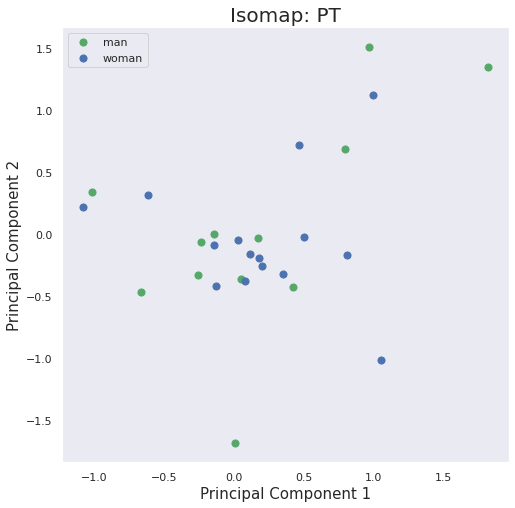

In [890]:
iso_comps = iso_transform(diff_pt, man_woman_pt, targets_pt)
plot_man_woman(iso_comps, 'Isomap: PT')

Embedding Shape :  (40, 2)


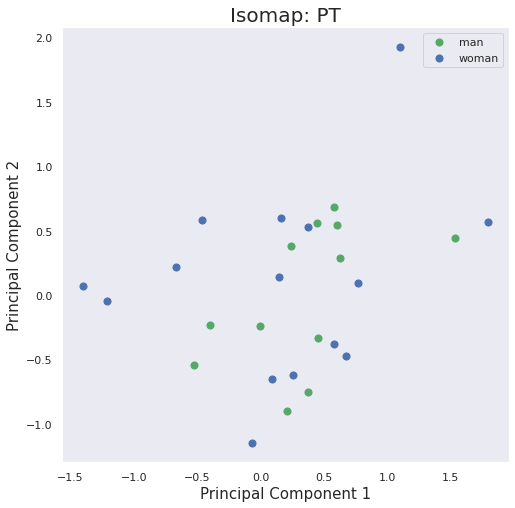

In [986]:
iso_comps = iso_transform(diff_pt_ieat, man_woman_pt, targets_pt)
plot_man_woman(iso_comps, 'Isomap: PT')

Embedding Shape :  (30, 2)


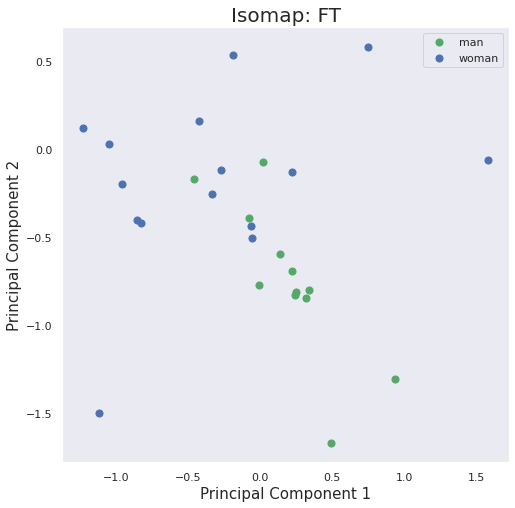

In [892]:

iso_comps_ft = iso_transform(diff_ft, man_woman_ft, targets_ft)
plot_man_woman(iso_comps_ft, 'Isomap: FT')

Embedding Shape :  (40, 2)


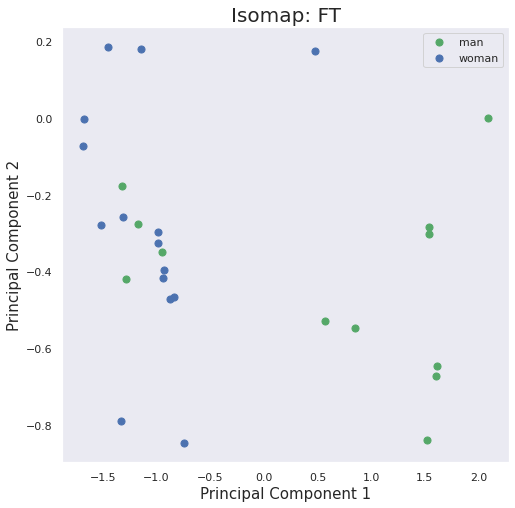

In [987]:

iso_comps_ft = iso_transform(diff_ft_ieat, man_woman_ft, targets_ft)
plot_man_woman(iso_comps_ft, 'Isomap: FT')

Embedding Shape :  (30, 2)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

targets:  22


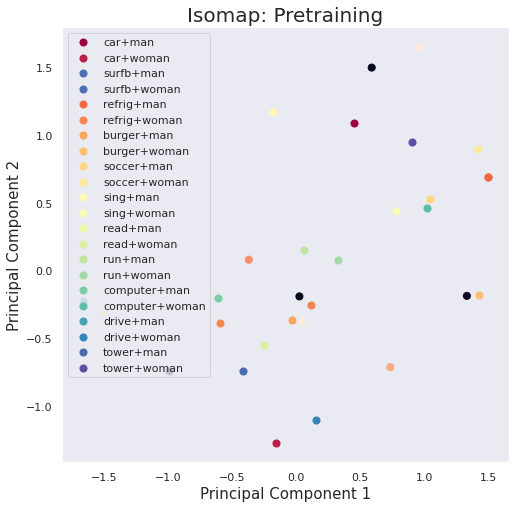

In [893]:

df_pt = iso_transform(diff_pt, images_features_pt, comps_targets)
plot_comps(df_pt, title='Isomap: Pretraining')



*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

Embedding Shape :  (30, 2)
targets:  22


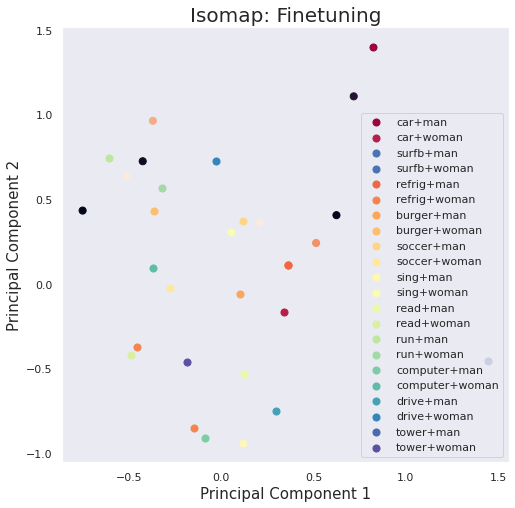

In [894]:


df_ft = iso_transform(diff_ft, images_features_ft, comps_targets)
plot_comps(df_ft, title='Isomap: Finetuning')



Embedding Shape :  (30, 2)


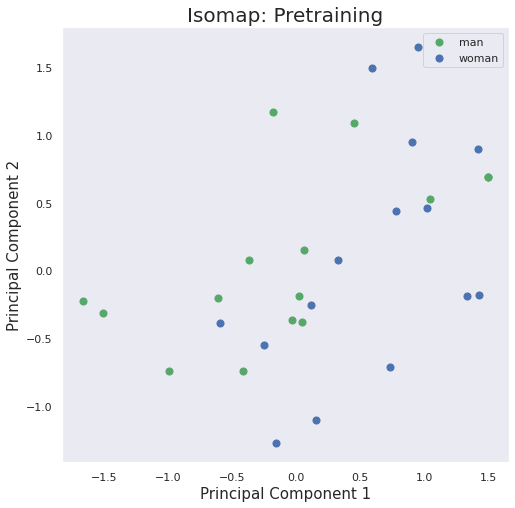

In [895]:


df_pt = iso_transform(diff_pt, images_features_pt, comps_man_woman_targets)
plot_man_woman(df_pt, title='Isomap: Pretraining')



Embedding Shape :  (30, 2)


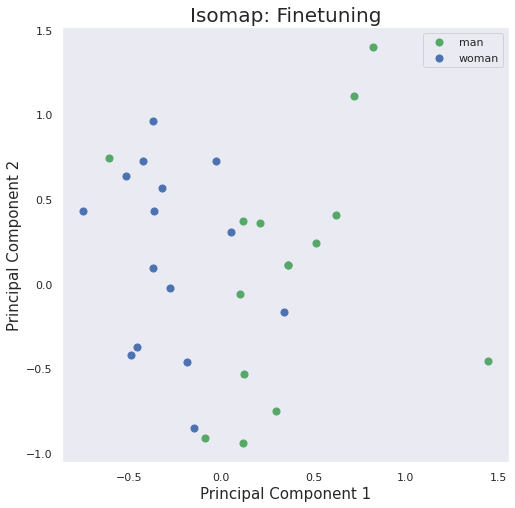

In [896]:

df_ft = iso_transform(diff_ft, images_features_ft, comps_man_woman_targets)
plot_man_woman(df_ft, title='Isomap: Finetuning')



Embedding Shape :  (30, 2)


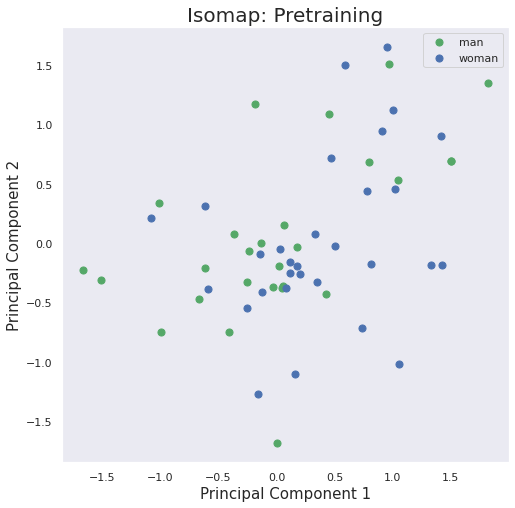

In [897]:


df_pt = iso_transform(diff_pt, comps_gender_imgs, comps_gender_targets)
plot_man_woman(df_pt, title='Isomap: Pretraining')


Embedding Shape :  (30, 2)


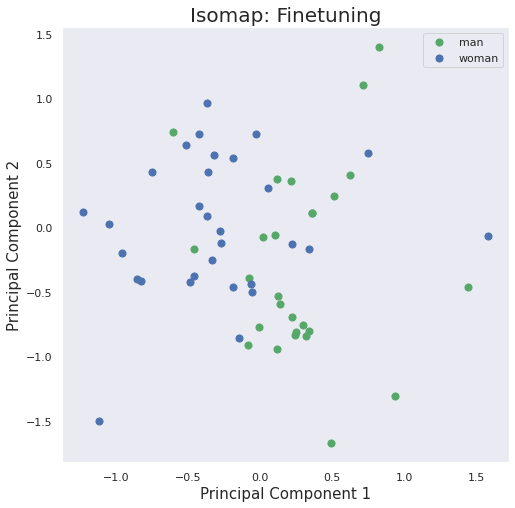

In [898]:


df_ft = iso_transform(diff_ft, comps_gender_imgs_ft, comps_gender_targets)
plot_man_woman(df_ft, title='Isomap: Finetuning')




Embedding Shape :  (30, 2)


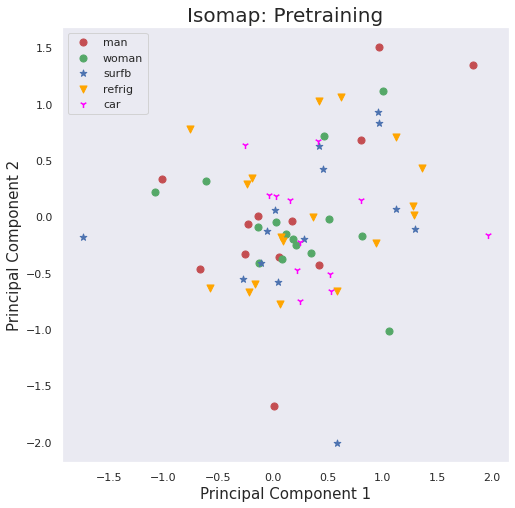

In [899]:

df_pt = iso_transform(diff_pt, cats_gender_pt, targets_pt_cats)
plot_cats(df_pt, title='Isomap: Pretraining')



Embedding Shape :  (40, 2)


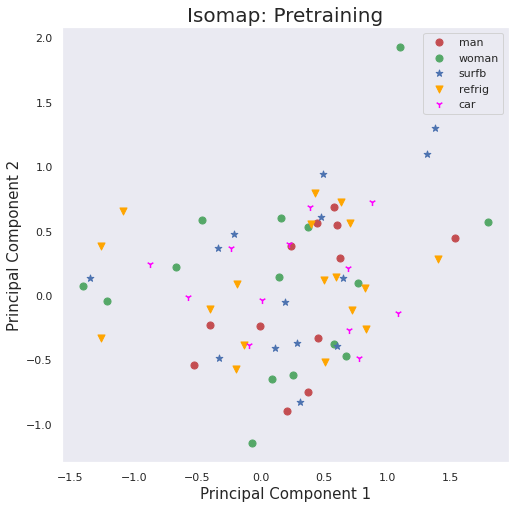

In [985]:

df_pt = iso_transform(diff_pt_ieat, cats_gender_pt, targets_pt_cats)
plot_cats(df_pt, title='Isomap: Pretraining')


Embedding Shape :  (30, 2)


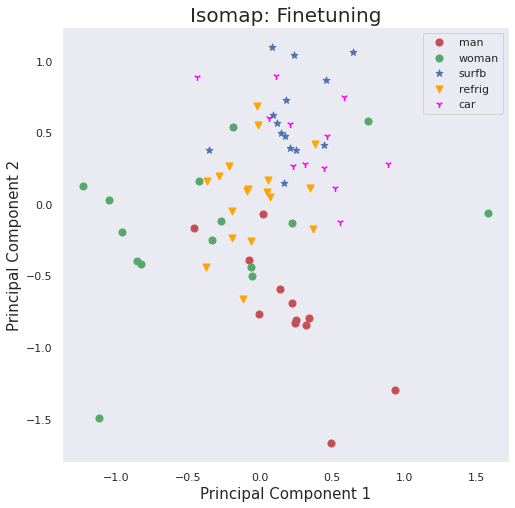

In [900]:

df_ft = iso_transform(diff_ft, cats_gender_ft, targets_ft_cats)
plot_cats(df_ft, title='Isomap: Finetuning')

Embedding Shape :  (40, 2)


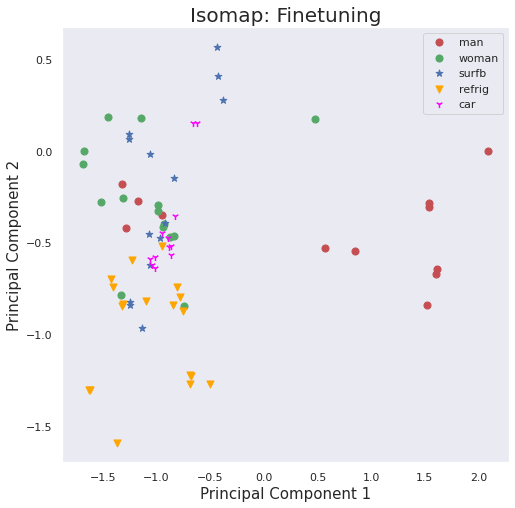

In [984]:

df_ft = iso_transform(diff_ft_ieat, cats_gender_ft, targets_ft_cats)
plot_cats(df_ft, title='Isomap: Finetuning')

# Manual PCA

(2048, 2048)
(2048,)
(2048, 2048)
(7, 2)


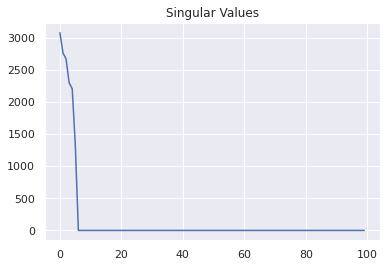

In [154]:
C = np.matmul(pt_diffvecs.T, pt_diffvecs) # Covariance matrix
print(C.shape)
w, v = np.linalg.eig(C)

plt.plot(np.arange(100), w[:100])
plt.title("Singular Values")

print(w.shape)
print(v.shape)
transformed = np.matmul(pt_diffvecs, v[:2].T)
print(transformed.shape)

Number of components required to achieve 90% of data variance: 5


Text(0, 0.5, 'Accumulated Data Variance')

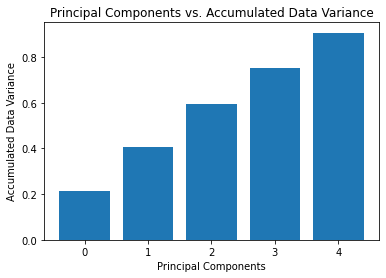

In [113]:
def pca_num_comp(eigh_vals, variance):
    # returns number of principal components required to achieve x% of data variance
    # get 90% of total sum of eigenvalues

    total_sum = np.sum(eigh_vals)
    accum_sum = 0
    percent = 0
    interm_variance = []
    interm_variance_frac = []

    for x in np.nditer(eigh_vals):
        accum_sum+=x
        interm_variance.append(accum_sum)

        percent = accum_sum/total_sum
        interm_variance_frac.append(percent)
        if percent*100 >= variance:
            print("Number of components required to achieve "+ str(variance) + "% of data variance: " + str(len(interm_variance)))
            break
    return np.arange(len(interm_variance)), interm_variance, interm_variance_frac

num_comp, variances, interm_variance_frac = pca_num_comp(w, 90) 
plt.bar(num_comp, interm_variance_frac)
plt.title("Principal Components vs. Accumulated Data Variance")
plt.xlabel("Principal Components")
plt.ylabel("Accumulated Data Variance")